Kütüphaneleri Yükle

In [1]:
!pip install -q numpy<2
!pip install -q numpy<2 pandas seaborn matplotlib plotly opencv-python pydicom pylibjpeg scipy scikit-learn tqdm


/bin/bash: line 1: 2: No such file or directory
/bin/bash: line 1: 2: No such file or directory


In [2]:
# Gerekli kütüphaneleri yükle
!pip install -qU python-gdcm pydicom pylibjpeg

# Veri manipülasyonu ve görselleştirme kütüphaneleri
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import cv2

# Dosya ve dizin işlemleri
import pydicom
from os import listdir

# İstatistiksel ve veri işleme kütüphaneleri
from scipy.stats import mode, skew
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture

# İlerleme takibi ve uyarı bastırma
from tqdm.notebook import trange
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Grafik stili
sns.set_style('darkgrid')


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 82.8 MB/s eta 0:00:00


Hasta Verilerini Keşfet

Test seti yalnızca tek bir hasta için bir örnek içeriyor. Sadece train setine odaklanalım.

In [3]:
filepath = '/kaggle/input/rsna-breast-cancer-detection/train.csv'
data = pd.read_csv(filepath)
data.head()

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,site_id,patient_id,image_id,laterality,view,age,cancer,biopsy,invasive,BIRADS,implant,density,machine_id,difficult_negative_case
0,2,10006,462822612,L,CC,61.0,0,0,0,NaN,0,NaN,29,False
1,2,10006,1459541791,L,MLO,61.0,0,0,0,NaN,0,NaN,29,False
2,2,10006,1864590858,R,MLO,61.0,0,0,0,NaN,0,NaN,29,False
3,2,10006,1874946579,R,CC,61.0,0,0,0,NaN,0,NaN,29,False
4,2,10011,220375232,L,CC,55.0,0,0,0,0.0,0,NaN,21,True


In [4]:
# Eksik değerler
data.isna().sum()

site_id                        0
patient_id                     0
image_id                       0
laterality                     0
view                           0
age                           37
cancer                         0
biopsy                         0
invasive                       0
BIRADS                     28420
implant                        0
density                    25236
machine_id                     0
difficult_negative_case        0
dtype: int64

Sadece yaş, BIRADS ve yoğunluk değerleri eksik.

Temel Bilgiler

In [5]:
# Verideki farklı hasta sayısını hesapla
num_patients = data['patient_id'].nunique()

# En genç hastanın yaşını bul
min_patient_age = int(data['age'].min())

# En yaşlı hastanın yaşını bul
max_patient_age = int(data['age'].max())

# Her hasta için 'cancer' kolonundaki maksimum değeri al (1: pozitif, 0: negatif)
groupby_id = data.groupby('patient_id')['cancer'].max()

# Meme kanseri negatif olan hasta sayısını hesapla
n_negative = (groupby_id == 0).sum()

# Meme kanseri pozitif olan hasta sayısını hesapla
n_positive = (groupby_id == 1).sum()

# Sonuçları ekrana yazdır
print(f"Veri kümesinde toplam {num_patients} farklı hasta bulunmaktadır.\n")
print(f"En genç hasta {min_patient_age} yaşındadır.")
print(f"En yaşlı hasta {max_patient_age} yaşındadır.\n")
print(f"Meme kanseri negatif olan {n_negative} hasta bulunmaktadır. Oranı = {n_negative / num_patients:.2f}")
print(f"Meme kanseri pozitif olan {n_positive} hasta bulunmaktadır. Oranı = {n_positive / num_patients:.2f}")


Veri kümesinde toplam 11913 farklı hasta bulunmaktadır.

En genç hasta 26 yaşındadır.
En yaşlı hasta 89 yaşındadır.

Meme kanseri negatif olan 11427 hasta bulunmaktadır. Oranı = 0.96
Meme kanseri pozitif olan 486 hasta bulunmaktadır. Oranı = 0.04


Sınıflandırma sorunu çok dengesiz. Hastaların yaklaşık %4'ü pozitif sınıfta, bu da azınlıkta kanser örneği olacağı anlamına geliyor.

Yaş Dağılımı

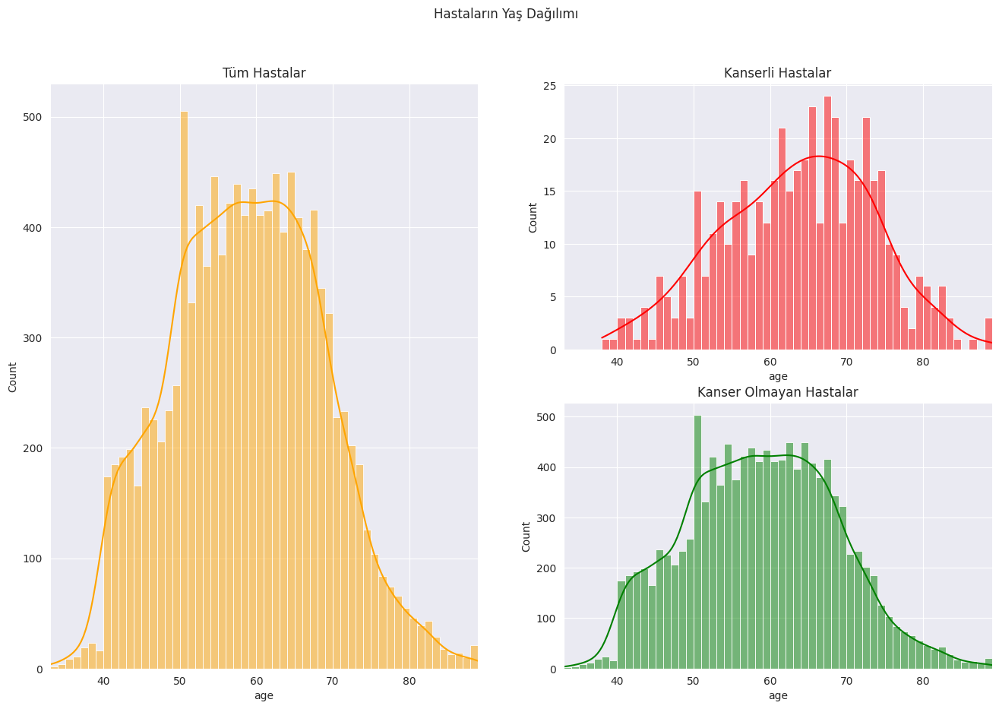

In [6]:
# Her hastanın yaşını almak için 'patient_id' bazında gruplayarak yaşları al
# Aynı hastanın birden fazla verisi varsa, sadece tek bir yaş değeri alınır
ages = data.groupby('patient_id')['age'].apply(lambda x: x.unique()[0])

# Sadece kanserli hastaların yaşlarını al
cancer_ages = data[data['cancer'] == 1].groupby('patient_id')['age'].apply(lambda x: x.unique()[0])

# Sadece kanser olmayan hastaların yaşlarını al
no_cancer_ages = data[data['cancer'] == 0].groupby('patient_id')['age'].apply(lambda x: x.unique()[0])

# Grafik boyutunu belirle (16x10 boyutunda bir grafik oluşturuluyor)
plt.figure(figsize=(16, 10))

# Tüm hastaların yaş dağılımını çiz (turuncu renk ile)
plt.subplot(1, 2, 1)  # 1 satır, 2 sütun, 1. grafik
sns.histplot(ages, bins=63, color='orange', kde=True)  # Yaş dağılımını çiz
plt.title("Tüm Hastalar")  # Grafik başlığı
plt.xlim(33, 89)  # X ekseni sınırlarını belirle

# Kanserli hastaların yaş dağılımını çiz (kırmızı renk ile)
plt.subplot(2, 2, 2)  # 2 satır, 2 sütun, 2. grafik
sns.histplot(cancer_ages, bins=51, color='red', kde=True)  # Kanserli hastaların yaş dağılımı
plt.title("Kanserli Hastalar")  # Grafik başlığı
plt.xlim(33, 89)  # X ekseni sınırlarını belirle

# Kanser olmayan hastaların yaş dağılımını çiz (yeşil renk ile)
plt.subplot(2, 2, 4)  # 2 satır, 2 sütun, 4. grafik
sns.histplot(no_cancer_ages, bins=63, color='green', kde=True)  # Kanser olmayan hastaların yaş dağılımı
plt.title("Kanser Olmayan Hastalar")  # Grafik başlığı
plt.xlim(33, 89)  # X ekseni sınırlarını belirle

# Genel başlık ekle
plt.suptitle("Hastaların Yaş Dağılımı")

# Grafikleri göster
plt.show()


Meme kanseri hastalarının yaş dağılımının sağlıklı hastalara göre negatif çarpık olduğu dikkati çekmektedir.

In [7]:
# Temel İstatistikler

print("Mean:", ages.mean())             # Ortalama yaş
print("Std:", ages.std())               # Standart sapma (yaşların saçılma derecesi)
print("Q1:", ages.quantile(0.25))       # 1. çeyrek (25%'lik kısım)
print("Median:", ages.median())         # Medyan (ortanca değer)
print("Q3:", ages.quantile(0.75))       # 3. çeyrek (75%'lik kısım)
print("Mode:", ages.mode()[0])          # Mod (en sık görülen yaş değeri)


Mean: 58.63821923561529
Std: 9.885104442511665
Q1: 51.0
Median: 59.0
Q3: 66.0
Mode: 50.0


Veri analizi sonucunda, hastaların büyük çoğunluğunun 40 yaşın üzerinde olduğu görülmektedir. Özellikle 50 yaş civarında belirgin bir yoğunlaşma (zirve) dikkat çekmektedir. Bu yaş aralığını takiben, 70 yaşına kadar hasta sayısında görece sabit bir seyir izlenirken, sonrasında belirgin bir düşüş gözlemlenmektedir.

Kanser teşhisi konan hastaların yaş dağılımı incelendiğinde ise, bu hastaların genel hasta grubuna kıyasla daha ileri yaşlarda olduğu fark edilmektedir. Bu durum, yaşın kanser riskini etkileyen önemli bir faktör olabileceğini göstermektedir.

Hasta Başına Görüntü Sayısı

Her hastanın sahip olduğu görüntü sayısını gösterir ve hastaların görüntü sayılarına göre dağılımlarını incelememize olanak tanır. Grafik, her bir hasta için kaç görüntü bulunduğunu ve bu görüntülerin oranlarını görselleştirir.

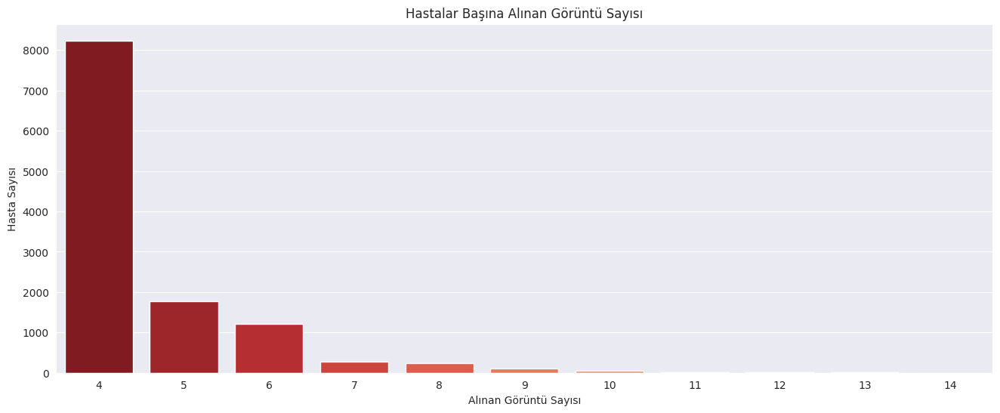

In [8]:
# Her bir hastadan alınan görüntü sayısını hesaplayalım
n_images_per_patient = data['patient_id'].value_counts()

# Görüntü sayısına göre hasta sayısının dağılımını elde edelim
images_per_patient_count = n_images_per_patient.value_counts().sort_index()

# Grafik boyutunu ayarlayalım (16x6 boyutunda)
plt.figure(figsize=(16, 6))

# Çubuk grafik çizelim
sns.barplot(x=images_per_patient_count.index, y=images_per_patient_count.values, palette='Reds_r')

# Başlık ve eksen etiketlerini ekleyelim
plt.title("Hastalar Başına Alınan Görüntü Sayısı")
plt.xlabel('Alınan Görüntü Sayısı')  # X eksenini etiketleyelim
plt.ylabel('Hasta Sayısı')  # Y eksenini etiketleyelim

# Grafiği gösterelim
plt.show()


Hastaların çoğunun 4 görüntüsü vardır (her tarafta 2 görünüm) ancak bazen daha fazlası da vardır.

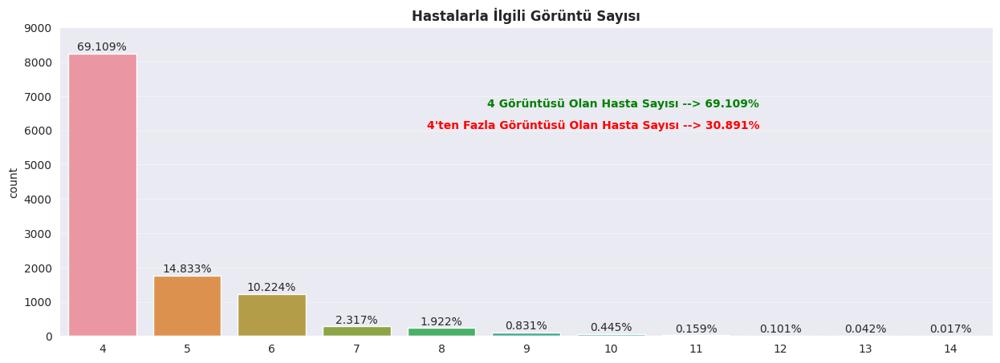

In [9]:
import warnings
# Deprecation, User ve Future uyarılarını görmezden geliyoruz
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Grafik boyutlarını ayarlıyoruz
plt.figure(figsize=(15,5))

# 'patient_id' sayısına göre gruplama yapıyoruz ve countplot çiziyoruz
# Burada, 'patient_id' başına kaç görüntü olduğunu sayıyoruz
ax = sns.countplot(x=data.groupby('patient_id').size())  

# Benzersiz hasta sayısını alıyoruz
t = data['patient_id'].nunique()

# Başlık ekliyoruz
ax.set_title('Hastalarla İlgili Görüntü Sayısı', fontweight='bold')

# Y eksenini sınırlıyoruz
ax.set_ylim(0, 9000)  

# Her bir bar'ın üstüne yüzdeleri yazdırıyoruz
for p in ax.patches:
    # Yüzde hesaplaması
    percentage = f'{100 * p.get_height() / t:.3f}%\n'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    # Yüzdeleri bar'ların üstüne ekliyoruz
    ax.annotate(percentage, (x, y), ha='center', va='center')
    # Y eksenine grid çizgisi ekliyoruz
    ax.grid(axis='y', linestyle='-', alpha=0.4)

# Grafik üzerine metin ekliyoruz
ax.text(x=0.75, y=0.77, transform=ax.transAxes, s="4 Görüntüsü Olan Hasta Sayısı --> 69.109%", fontsize=10, color='green', fontweight='bold', verticalalignment='top', horizontalalignment='right')
ax.text(x=0.75, y=0.70, transform=ax.transAxes, s="4'ten Fazla Görüntüsü Olan Hasta Sayısı --> 30.891%", fontsize=10, color='red', fontweight='bold', verticalalignment='top', horizontalalignment='right')

# Grafiği gösteriyoruz
plt.show()


Hastaların %69.109'u için çekilen görüntü sayısı 4, geri kalan %30.891'lik kısmı ise 4'ten fazla görüntüye sahiptir.

Yoğunluk Dağılımı

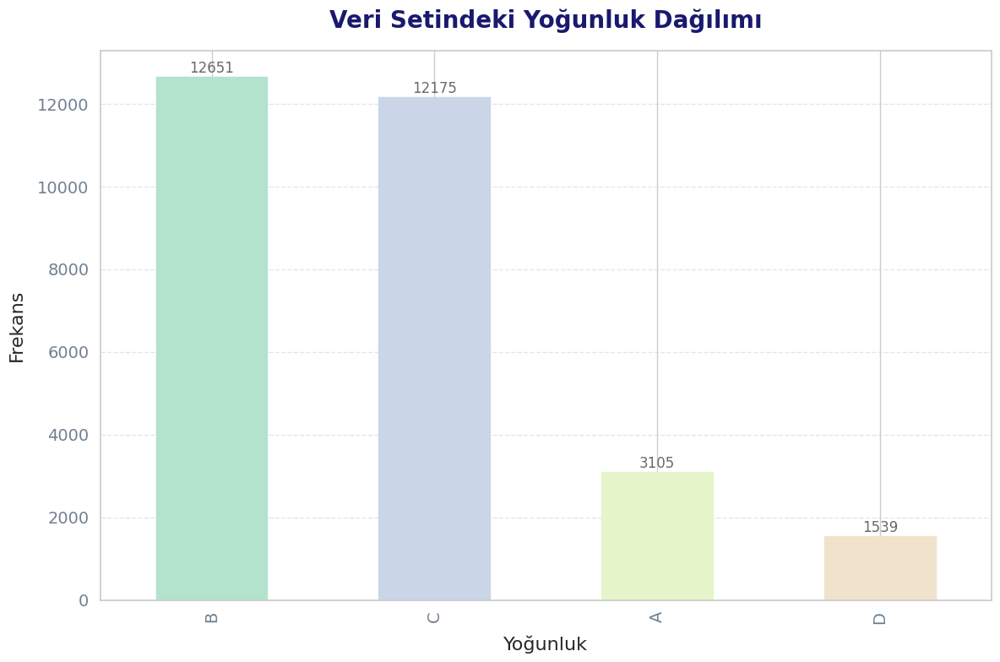

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastel tonlarında yüksek kaliteli bir stil ayarlıyoruz
sns.set(style="whitegrid")

# Yoğunluk dağılımını çizmek ve iyileştirmeler yapmak için grafik boyutunu ayarlıyoruz
plt.figure(figsize=(12, 8))

# 'density' sütununun frekanslarını hesaplıyoruz
density_counts = data['density'].value_counts()

# Çubuk grafik çiziyoruz
bars = density_counts.plot(kind='bar', edgecolor='black', color='coral', alpha=1.0)

# Başlık ve etiketleri ekliyoruz
plt.title('Veri Setindeki Yoğunluk Dağılımı', fontsize=20, fontweight='bold', color='midnightblue', pad=20)
plt.xlabel('Yoğunluk', fontsize=16, labelpad=10)
plt.ylabel('Frekans', fontsize=16, labelpad=10)

# Barlar için pastel renkler uyguluyoruz
colormap = plt.cm.Pastel2  # Pastel renk skalası
for i, bar in enumerate(bars.containers[0]):  # Her bar için renk gradyanı uyguluyoruz
    bar.set_color(colormap(i / len(density_counts)))

# Daha iyi okunabilirlik için ızgara çizgileri ekliyoruz
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Her barın üstüne frekansı ekliyoruz
for i, (density, count) in enumerate(density_counts.items()):
    plt.text(i, count + 20, f'{count}', ha='center', va='bottom', fontsize=12, color='dimgray')

# Tık işaretlerini özelleştiriyoruz
plt.xticks(fontsize=14, color='slategray')
plt.yticks(fontsize=14, color='slategray')

# Grafik düzenlemesi yapıyoruz
plt.tight_layout()

# Grafiği gösteriyoruz
plt.show()


In [11]:
!pip install plotly


In [12]:
import pandas as pd
from IPython.display import display, HTML
import plotly.graph_objects as go

# Highlight fonksiyonu tanımlıyoruz
def highlightcol(val):
    color = 'yellow' if val == 1 else 'green'  # Kanser olan hücreler sarı, olmayanlar yeşil
    return f'background-color: {color}'

# Her bir 'patient_id' için, kanser değeri (cancer) 1'den fazla olan hastaları buluyoruz
non_unique = data.groupby('patient_id').cancer.transform('nunique').ne(1)
cancer_notunique = data[non_unique]

# Kanser değerinin hem True (1) hem de False (0) olduğu hastaları sayıyoruz ve örnek veriyi görüntülüyoruz
display(HTML(f"<h3><br/>Kanser değerinin hem True(1) hem de False(0) olduğu {cancer_notunique.patient_id.nunique()} hasta bulunmaktadır."))
display(HTML(f"<h4><br/>Örnek veri"))

# İlk hastanın verisini stil ile gösteriyoruz
display(cancer_notunique[cancer_notunique['patient_id']==cancer_notunique.patient_id.unique()[0]].style.applymap(highlightcol, subset=pd.IndexSlice[:, ['cancer']]))
display(HTML(f"<h3><br/>Zaman verisi bulunmadığı için, bu 480 veri örneği, hastanın görüntü ID'si sırasına göre analiz edilecektir."))

# Tam iyileşen ve hala kanseri devam eden hastaların sayısını takip etmek için değişkenler
completely_cured = 0
still_have_cancer = 0
cured_list = []
still_have_cancer_list = []

# Her bir hasta için kanser geçmişini kontrol ediyoruz
for i in range(len(cancer_notunique.patient_id.unique())):
    list_0 = []
    list_1 = []       
    temp = cancer_notunique[cancer_notunique['patient_id']==cancer_notunique.patient_id.unique()[i]]
    
    # Kanseri olmayan ve kanseri olan görüntü ID'lerini ayırıyoruz
    list_0 = temp[temp['cancer']==0]['image_id']
    list_1 = temp[temp['cancer']==1]['image_id']
    
    # Eğer tüm kanseri olan görüntü ID'leri, kanseri olmayanlardan sonra geliyorsa, tamamen iyileşmiş olarak kabul ediyoruz
    if(all(i < max(list_0) for i in list_1)):
        completely_cured += 1
        cured_list.append(max(list_0))
    else:
        still_have_cancer += 1
        still_have_cancer_list.append(max(list_1))

# Tam iyileşen ve hala kanseri devam eden hastaların sayısını gösteriyoruz
display(HTML(f"<h3><br/>Bu 480 örnekten, {completely_cured} tamamen iyileşmiş, {still_have_cancer} ise hala kanserli."))

# Tam iyileşen hastaların verilerini alıyoruz
temp_cured = data[data['image_id'].isin(cured_list)]

# Tam iyileşen hastaların verilerini tablo şeklinde gösteriyoruz
fig = go.Figure(data=[go.Table(header=dict(values=temp_cured.columns, fill_color='light gray'),
                 cells=dict(values=[temp_cured], fill_color='lavenderblush'))])

# Tam iyileşen hastalar için başlık ve renkli bir tablo gösterimi yapıyoruz
fig = go.Figure(data=[go.Table(header=dict(values=['site_id', 'patient_id', 'image_id', 'cancer'], fill_color='hotpink'),
                 cells=dict(values=[temp_cured[temp_cured.columns[0]], temp_cured[temp_cured.columns[1]], temp_cured[temp_cured.columns[2]], temp_cured[temp_cured.columns[6]]], fill_color='lightgreen'))])

fig.update_layout(title="480 örnekten tamamen iyileşen hastalar (en son görüntü ID'si ve kanser durumu)")

# Grafiği gösteriyoruz
fig.show()

# Hala kanseri devam eden hastaların verilerini alıyoruz
temp_uncured = data[data['image_id'].isin(still_have_cancer_list)]

# Hala kanseri devam eden hastaların verilerini tablo şeklinde gösteriyoruz
fig = go.Figure(data=[go.Table(header=dict(values=temp_uncured.columns, fill_color='light gray'),
                 cells=dict(values=[temp_cured], fill_color='lavenderblush'))])

# Hala kanseri devam eden hastalar için başlık ve renkli bir tablo gösterimi yapıyoruz
fig = go.Figure(data=[go.Table(header=dict(values=['site_id', 'patient_id', 'image_id', 'cancer'], fill_color='pink'),
                 cells=dict(values=[temp_uncured[temp_uncured.columns[0]], temp_uncured[temp_uncured.columns[1]], temp_uncured[temp_uncured.columns[2]], temp_uncured[temp_uncured.columns[6]]], fill_color='skyblue'))])

fig.update_layout(title="480 örnekten, kanseri devam eden hastalar (en son görüntü ID'si ve kanser durumu)")

# Grafiği gösteriyoruz
fig.show()


,site_id,patient_id,image_id,laterality,view,age,cancer,biopsy,invasive,BIRADS,implant,density,machine_id,difficult_negative_case
87,1,10130,388811999,L,MLO,71.000000,1,1,1,0.000000,0,B,49,False
88,1,10130,613462606,L,CC,71.000000,1,1,1,0.000000,0,B,49,False
89,1,10130,1360338805,L,CC,71.000000,1,1,1,0.000000,0,B,49,False
90,1,10130,1672636630,L,MLO,71.000000,1,1,1,0.000000,0,B,49,False
91,1,10130,1013166704,R,CC,71.000000,0,0,0,nan,0,B,49,False
92,1,10130,1165309236,R,CC,71.000000,0,0,0,nan,0,B,49,False
93,1,10130,2110820077,R,MLO,71.000000,0,0,0,nan,0,B,49,False


In [13]:
# 'non_unique' değeri False olanları seçiyoruz.
# Bu, sadece bir tür 'cancer' etiketine (ya 0 ya da 1) sahip hastaları temsil eder.
# copy() ile uyarı mesajlarından kaçınıyoruz (SettingWithCopyWarning).
cancer_unique_df = data[~non_unique].copy()

# Her bir hastanın ('patient_id') kaç farklı 'cancer' etiketine sahip olduğunu kontrol ediyoruz.
# Eğer çıktı sadece [1] ise, tüm hastaların yalnızca tek bir kanser durumu vardır (ya 0 ya da 1).
print(cancer_unique_df.groupby('patient_id').cancer.nunique().unique())

# Yalnızca analizde kullanacağımız sütunları alıyoruz: 'patient_id' ve 'cancer'.
cancer_unique = cancer_unique_df[['patient_id', 'cancer']]

# Aynı 'patient_id' ve 'cancer' bilgisine sahip birden fazla satır olabilir.
# Bunlardan sadece ilkini tutuyor, diğer tekrar edenleri kaldırıyoruz.
# inplace=False olduğu için, orijinal veriyi bozmadan yeni bir DataFrame oluşturuluyor.
cancer_unique = cancer_unique.drop_duplicates(keep='first')


[1]


Kanser Gelişimi Takibi: Başlangıçta Sağlıklı Hastaların Zaman İçindeki Seyri Başlangıçta kanseri olmayan hastaların, zaman içinde kanser gelişimi açısından nasıl bir sıralama izlediğini analiz etmek. Özellikle şu iki duruma odaklanılıyor: İlk görüntüde kanser yok (0), sonra varsa (1) → gelişen kanser durumu Bazı hastalarda 0 → 1 → tekrar 0 → tekrar 1 gibi karmaşık sıralar olabilir

In [14]:
# Başlangıçta sayaçları sıfırlıyoruz
counter_0_1_0_1 = 0   # 0 → 1 → 0 → 1 geçişi yapan hasta sayısı
counter_0_0_1_1 = 0   # 0 → 0 → 1 → 1 gibi net geçiş yapan hasta sayısı
c_0 = 0               # İlk görüntüsünde kanser olmayan (cancer = 0) hasta sayısı
c_1 = 0               # İlk görüntüsünde kanser olan (cancer = 1) hasta sayısı

# Hasta ID'lerini ve durumlarını saklayacağımız listeler
list_c_0 = []                 # İlk görüntüsünde kanser olmayan hastaların ID'leri
list_c_1 = []                 # İlk görüntüsünde kanserli olan hastaların ID'leri
list_counter_0_1_0_1 = []     # 0 → 1 → 0 → 1 geçişi yapan hastaların ID'leri
list_counter_0_0_1_1 = []     # 0 → 0 → 1 → 1 geçişi yapan hastaların ID'leri
count = 0                     # Yukarıdakilere uymayan hasta sayısı

# Sadece tam iyileşmeyen hastalardan oluşan alt veri kümesini alıyoruz
temp_df = data[data['patient_id'].isin(temp_uncured['patient_id'])][['patient_id', 'image_id', 'cancer']]

# Her bir hastayı sırayla inceleyerek geçiş desenlerini kontrol ediyoruz
for i in range(len(temp_df.patient_id.unique())):
    patient_id = temp_df.patient_id.unique()[i]

    # İlgili hastanın tüm görüntülerini ve kanser durumlarını alıyoruz
    list_image = temp_df[temp_df['patient_id'] == patient_id]['image_id']
    list_0 = temp_df[(temp_df['cancer'] == 0) & (temp_df['patient_id'] == patient_id)]['image_id']
    list_1 = temp_df[(temp_df['cancer'] == 1) & (temp_df['patient_id'] == patient_id)]['image_id']

    # En küçük görüntü ID'sine ait kanser durumunu kontrol ediyoruz (ilk görüntü)
    first_cancer_status = temp_df[temp_df['image_id'] == min(list_image)]['cancer'].values[0]

    if first_cancer_status == 0:
        c_0 += 1
        list_c_0.append(patient_id)

        # 0 → 1 → 0 → 1 gibi bir geçiş varsa
        if max(list_0) > min(list_1):
            counter_0_1_0_1 += 1
            list_counter_0_1_0_1.append(patient_id)

        # 0 → 0 → 1 → 1 gibi net bir geçiş varsa
        elif max(list_0) < min(list_1):
            counter_0_0_1_1 += 1
            list_counter_0_0_1_1.append(patient_id)

        else:
            count += 1  # Yukarıdaki şemalara uymayan hasta

    else:
        c_1 += 1
        list_c_1.append(patient_id)


Kanser Durumu Değişim Analizi ve Hasta Kategorileri Dağılımı
Kanser durumu değişen ve değişmeyen hastaların analizini ve kategorik dağılımını yansıtır.

In [15]:
# Boş bir DataFrame oluşturuyoruz
cancer_df = pd.DataFrame()

# Her hasta tipi için adları tanımlıyoruz (kanser durumu ile ilgili kategoriler)
cancer_df['Patients Cancer Status'] = [
    'Cancer Stats False from Beginning',  # Başlangıçta kanseri olmayan hastalar
    'Cancer Stats True from Beginning',   # Başlangıçta kanseri olan hastalar
    'Completely Cured',                   # Tam iyileşen hastalar
    'Cancer Stats False Turned True then False, Finally True',  # Durumu 0'dan 1'e ve tekrar 0'a dönüşen hastalar
    'Cancer Stats Turned True',           # Durumu 0'dan 1'e dönüşen hastalar
    'Cancer Stats True Turned False, Finally True'  # Başlangıçta kanseri olan ama sonra iyileşen hastalar
]

# İlgili kategorilere göre hasta sayısını dolduruyoruz
cancer_df['Count'] = [
    cancer_unique.cancer.value_counts().values[0],  # Başlangıçta kanseri olmayan hastalar
    cancer_unique.cancer.value_counts().values[1],  # Başlangıçta kanseri olan hastalar
    completely_cured,  # Tam iyileşen hastalar
    counter_0_1_0_1,  # Durumu 0'dan 1'e ve tekrar 0'a dönüşen hastalar
    counter_0_0_1_1,  # Durumu 0'dan 1'e dönüşen hastalar
    c_1  # Başlangıçta kanseri olan hastalar
]

# 'Patients Cancer Status' sütununu indeks olarak ayarlıyoruz
cancer_df.set_index(cancer_df.columns[0], inplace=True)

# Kanser durumu değişmeyen hastaların yüzdesini hesaplıyoruz
cancer_status_not_Changed = ((11427 + 6) / cancer_df['Count'].sum() * 100)

# Kanser durumu değişen hastaların yüzdesini hesaplıyoruz
cancer_status_changed = ((235 + 90 + 66 + 89) / cancer_df['Count'].sum() * 100)

# Sonuçları gösterelim
print("Kanser Durumu Değişmeyen Hastaların Yüzdesi: {:.2f}%".format(cancer_status_not_Changed))
print("Kanser Durumu Değişen Hastaların Yüzdesi: {:.2f}%".format(cancer_status_changed))

# DataFrame'i yazdıralım
print(cancer_df)


Kanser Durumu Değişmeyen Hastaların Yüzdesi: 95.97%
Kanser Durumu Değişen Hastaların Yüzdesi: 4.03%
                                                    Count
Patients Cancer Status                                   
Cancer Stats False from Beginning                   11427
Cancer Stats True from Beginning                        6
Completely Cured                                      235
Cancer Stats False Turned True then False, Fina...     90
Cancer Stats Turned True                               66
Cancer Stats True Turned False, Finally True           89


Kanser Durumu Analizi ve Hasta Kanser Durumu Değişim Grafiği
İki grafikte de yapılan analizleri ve hasta kategorilerindeki değişimleri özetler.

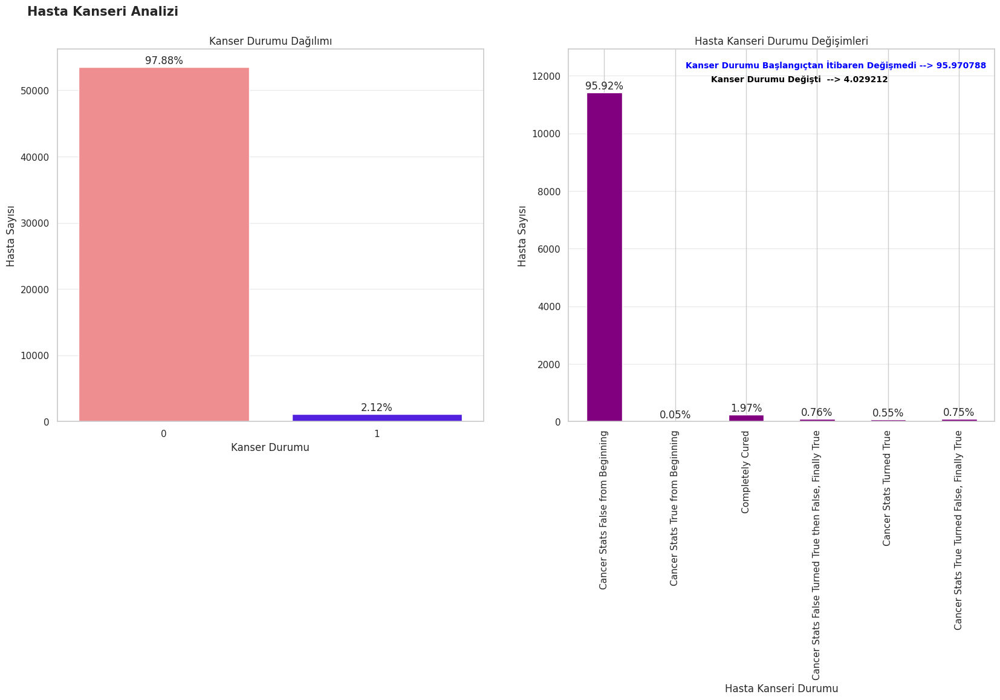

In [16]:
# 1x2 düzeninde iki adet subplot oluşturuyoruz ve figürün başlığını ekliyoruz
fig, ax = plt.subplots(1, 2, figsize=(20,8))  # 1 satır, 2 sütunlu bir grafik düzeni oluşturuyoruz
fig.text(0.1, 0.95, "Hasta Kanseri Analizi", fontsize=15, fontweight='bold')  # Figürün başlığını Türkçe olarak ekliyoruz

# İlk grafikte, 'cancer' sütunundaki 0 ve 1 değerlerinin sayısını gösteren countplot kullanıyoruz
sns.countplot(x="cancer", data=data, palette="gnuplot2_r", ax=ax[0])  # 'cancer' sütununun 0 ve 1 değerlerinin dağılımını gösteriyoruz
ax[0].set_title("Kanser Durumu Dağılımı")  # İlk grafiğe Türkçe başlık ekliyoruz
ax[0].set_xlabel("Kanser Durumu")  # X eksenine etiket ekliyoruz
ax[0].set_ylabel("Hasta Sayısı")  # Y eksenine etiket ekliyoruz

# İkinci grafikte, cancer_df'deki hasta sayılarının bar grafiğini çiziyoruz
ax[1] = cancer_df['Count'].plot(kind="bar", color='purple')  # Bar grafiği çiziyoruz
ax[1].set_title("Hasta Kanseri Durumu Değişimleri")  # İkinci grafiğe Türkçe başlık ekliyoruz
ax[1].set_xlabel("Hasta Kanseri Durumu")  # X eksenine etiket ekliyoruz
ax[1].set_ylabel("Hasta Sayısı")  # Y eksenine etiket ekliyoruz

# Her iki grafiğe de y ekseni için grid ekliyoruz
for i, ax in enumerate(ax.flatten()):  # Her iki eksende işlemleri sırasıyla yapıyoruz
    ax.grid(axis='y', linestyle='-', alpha=0.4)  # Y ekseni için grid ekliyoruz

    # İlk grafiğe başlık ekliyoruz
    if i == 0:
        t = data.shape[0]  # Veri sayısını alıyoruz
    else:
        # İkinci grafiğe başlık ekliyoruz ve yüzdeleri gösteriyoruz
        t = cancer_df['Count'].sum()  # Toplam hasta sayısını alıyoruz
        ax.set_ylim(0, cancer_df['Count'].max() + 1500)  # Y eksenini sınırlıyoruz
        # Kanser durumu değişmeyen ve değişen hastaların yüzdelerini ekliyoruz
        ax.text(x=0.98, y=0.97, transform=ax.transAxes, s="Kanser Durumu Başlangıçtan İtibaren Değişmedi --> %f" % cancer_status_not_Changed, fontsize=10, color='blue', fontweight='bold', verticalalignment='top', horizontalalignment='right')
        ax.text(x=0.75, y=0.93, transform=ax.transAxes, s="Kanser Durumu Değişti  --> %f" % cancer_status_changed , fontsize=10, color='black', fontweight='bold', verticalalignment='top', horizontalalignment='right')

    # Her bir bar'ın üstüne yüzdeleri yazdırıyoruz
    for p in ax.patches:
        percentage = f'{100 * p.get_height() / t:.2f}%\n'  # Yüzde hesaplama
        ax.annotate(percentage, (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='center')  # Yüzdeleri barların üzerine yazıyoruz

# Grafikleri gösteriyoruz
plt.show()  # Grafikleri ekranda gösteriyoruz


Veri kümesinde kanser durumu yanlış olan hastaların oranı %95,92 ile oldukça dengesizdir.
Hastaların %0,05'inin kanser durumu doğru olup, bu durum değişmemiştir.
Hastaların %1,97'si kanserden tamamen kurtulmuştur.
Hastaların %0,55'inin kanser durumu, yanlış durumdan doğru duruma dönüşmüştür.
Kanser durumu doğru olan hastaların %0,75'inin durumu, önce yanlış olmuş, sonrasında tekrar doğruya dönmüştür.
Kanser durumu yanlış olan hastaların %0,76'sının durumu, önce doğruya, ardından tekrar yanlış'a dönmüş ve nihayetinde tekrar doğruya dönmüştür.

Görüntü Analizi Hasta Kanser Durumuna Göre

cured_list: Tamamen iyileşmiş hastaların verilerini içerir.
list_c_0.append(temp_df.patient_id.unique()[i]): Kanser durumu 0 ile başlayıp, daha sonra 1 ile başlayıp, tekrar 0'a dönen hastalar için listeye ekler.
list_counter_0_1_0_1.append(temp_df.patient_id.unique()[i]): Kanser durumu sırasıyla 0, 1, 0 ve son olarak 1 olan hastalar için listeye ekler.
list_counter_0_0_1_1.append(temp_df.patient_id.unique()[i]): Kanser durumu sırasıyla 0, 0, 1 ve son olarak 1 olan hastalar için listeye ekler.
list_c_1.append(temp_df.patient_id.unique()[i]): Kanser durumu 1 ile başlayıp, ardından 0'a dönüp, tekrar 1 olan hastalar için listeye ekler.

Kanser durumu geçişlerini takip eden hastaların verilerini filtreleyerek farklı alt kümeler oluşturur. Her bir filtreleme işlemi, kanser durumu geçişlerini belirleyen hastaları belirli bir listeye ekler ve bu listeye dayalı olarak hastaların verilerini çıkarır.

In [17]:
# Kanser durumu başlangıçta False (0) olan hastaların verilerini filtreliyoruz
cancer_false_df = data[data['patient_id'].isin(cancer_unique[cancer_unique['cancer'] == 0]['patient_id'].unique())]

# Kanser durumu başlangıçta True (1) olan hastaların verilerini filtreliyoruz
cancer_true_df = data[data['patient_id'].isin(cancer_unique[cancer_unique['cancer'] == 1]['patient_id'].unique())]

# Tam olarak iyileşmiş hastaların verilerini filtreliyoruz
completely_cured_df = data[data['patient_id'].isin(data[data['image_id'].isin(cured_list)]['patient_id'].unique())]

# Kanser durumu sırasıyla 0-1-0-1 olan hastaların verilerini filtreliyoruz
cancer_0_1_0_1_df = data[data['patient_id'].isin(list_counter_0_1_0_1)]

# Kanser durumu sırasıyla 0-0-1-1 olan hastaların verilerini filtreliyoruz
cancer_0_0_1_1_df = data[data['patient_id'].isin(list_counter_0_0_1_1)]

# Kanser durumu sırasıyla 1-0-1 olan hastaların verilerini filtreliyoruz
cancer_1_0_1_df = data[data['patient_id'].isin(list_c_1)]


Hasta Kanser Durumu ve Çekilen Görüntüler Arasındaki İlişkinin Analizi
Bu analiz, hastaların kanser durumu ile çekilen görüntülerin sayısı arasındaki ilişkiyi incelemeyi amaçlamaktadır. Verilen veriler kullanılarak, kanser durumu ile görüntü sayıları arasındaki farklılıkları anlamak ve bu ilişkileri daha görsel bir şekilde sunmak için veriler normalize edilerek yüzde değerlerine dönüştürülmüş ve görselleştirilmiştir. Bu sayede hastaların kanser durumu ve görüntü sayılarının nasıl bir etkileşimde olduğunu analiz edebiliriz.

In [18]:
from IPython.display import display, HTML

# HTML biçiminde bir mesaj gösteriyoruz
display(HTML("<h3><br/>Hasta kanser durumu ile çekilen görüntüler arasındaki ilişkiyi analiz etmek için aşağıdaki bilgiler de kullanılacaktır.</h3>"))

# Kanser durumu ile ilgili sayıları normalize ederek yüzde değerlerine dönüştürüyoruz
cancer_df['Normalize'] = cancer_df['Count'] / cancer_df['Count'].sum() * 100

# DataFrame'e renkli bir arka plan gradyanı uyguluyoruz ve gösteriyoruz
styled_df = cancer_df.style.background_gradient(cmap='viridis_r')
display(styled_df)


,Count,Normalize
Patients Cancer Status,,
Cancer Stats False from Beginning,11427,95.920423
Cancer Stats True from Beginning,6,0.050365
Completely Cured,235,1.972635
"Cancer Stats False Turned True then False, Finally True",90,0.755477
Cancer Stats Turned True,66,0.554017
"Cancer Stats True Turned False, Finally True",89,0.747083


Hastaların Özelliklerine Göre Dağılımların Görselleştirilmesi
Hastaların farklı özelliklerine (örneğin, laterality, implant durumu, zorluk seviyesi, görüntüleme türü, yoğunluk kategorisi, ve site_id) göre verilerin dağılımlarını görselleştirmektir. Bu sayede, her bir kategorinin hastalar arasında ne kadar yaygın olduğunu ve belirli özelliklerin dağılımlarını daha iyi anlayabilmek hedeflenmektedir.

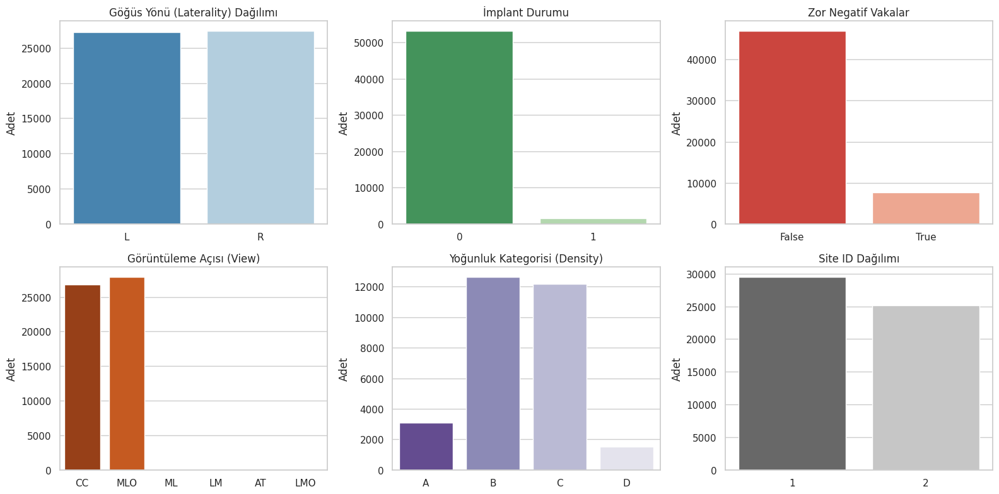

In [19]:
fig, ax = plt.subplots(2, 3, figsize=(16, 8))

# Her bir countplot için başlık ekliyoruz
sns.countplot(x=data['laterality'], palette='Blues_r', ax=ax[0, 0])
ax[0, 0].set_title("Göğüs Yönü (Laterality) Dağılımı")

sns.countplot(x=data['implant'], palette='Greens_r', ax=ax[0, 1])
ax[0, 1].set_title("İmplant Durumu")

sns.countplot(x=data['difficult_negative_case'], palette='Reds_r', ax=ax[0, 2])
ax[0, 2].set_title("Zor Negatif Vakalar")

sns.countplot(x=data['view'], palette='Oranges_r', ax=ax[1, 0])
ax[1, 0].set_title("Görüntüleme Açısı (View)")

sns.countplot(x=data['density'], palette='Purples_r', order=['A', 'B', 'C', 'D'], ax=ax[1, 1])
ax[1, 1].set_title("Yoğunluk Kategorisi (Density)")

sns.countplot(x=data['site_id'], palette='Greys_r', ax=ax[1, 2])
ax[1, 2].set_title("Site ID Dağılımı")

# Eksen isimlerini düzeltmek istersen (isteğe bağlı)
for axes in ax.flat:
    axes.set_xlabel("")
    axes.set_ylabel("Adet")

plt.tight_layout()
plt.show()


Resimler, lateralite açısından dengeli bir dağılıma sahiptir.
İmplantalı hastalar sadece birkaç görüntüde yer alırken, bu durum genel veri setinde nadir bir özellik göstermektedir.
Bazı görüntüler, zorluk seviyesi yüksek olan teşhislerden oluşmaktadır.
Görüntüleme türü açısından, en yaygın olanlar sadece CC (Craniocaudal) ve MLO (Mediolateral Oblique) pozisyonlarındaki görüntülerdir.
Göğüs dokusunun yoğunluğu bakımından, çok yüksek (D) ve çok düşük (A) yoğunluğa sahip görüntüler azınlıkta yer almaktadır. Çoğunlukla yoğunluk, orta seviyelerde (B ve C) dağılmaktadır.
Görüntüler, genellikle iki farklı bölgeden dengeli bir şekilde alınmıştır.

Kanser Durumu ve Biyopsi İlişkisi Üzerine Görselleştirme
Grafikler, 'cancer' sütununa göre kanser durumlarının dağılımını ve her bir 'cancer' sınıfı için biyopsi sonuçlarının yüzdelik oranlarını görselleştirir. İlk grafik, kanser durumu gösteren görüntülerin sayısını gösterirken, ikinci grafik biyopsi sonuçlarının her bir kanser sınıfına göre oranlarını heatmap şeklinde sunar.

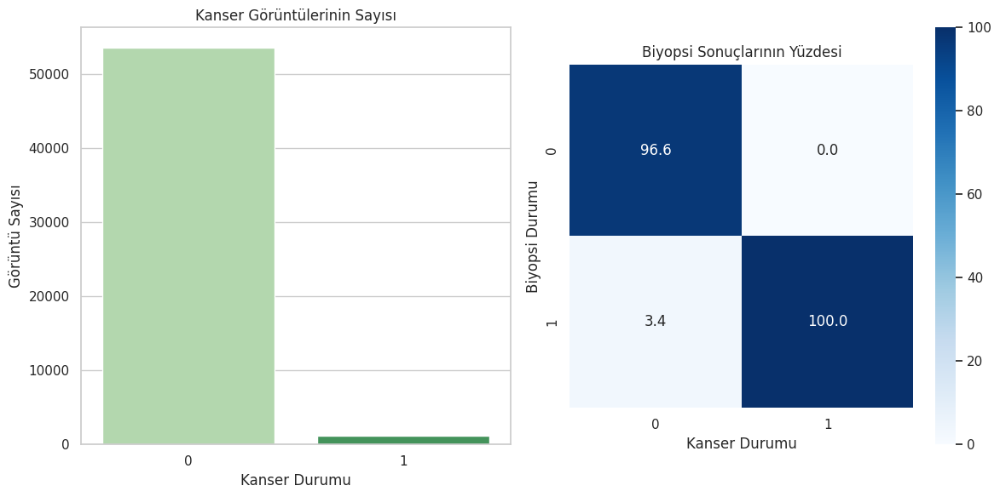

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

# 'biopsy' sütunu üzerinden gruplama yaparak her 'cancer' sınıfındaki 'biopsy' sayısını hesapla
biopsy_counts = data.groupby('cancer')['biopsy'].value_counts().unstack().fillna(0)

# 'biopsy' oranlarını yüzde cinsinden hesapla
biopsy_perc = (biopsy_counts.T / biopsy_counts.sum(axis=1)) * 100  # Yüzde

# 1 satır 2 sütunlu bir grafik düzeni oluştur
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Kanser durumuna göre görsel sayısını göster
sns.countplot(x='cancer', data=data, palette='Greens', ax=ax[0])
ax[0].set_title("Kanser Görüntülerinin Sayısı")
ax[0].set_xlabel("Kanser Durumu")
ax[0].set_ylabel("Görüntü Sayısı")

# Biyopsi yüzdelerini heatmap ile göster
# Eğer veri sayısal değilse, yüzde hesaplamasında herhangi bir hata olmadığından emin olun
sns.heatmap(biopsy_perc, square=True, annot=True, fmt='.1f', cmap='Blues', ax=ax[1])
ax[1].set_title("Biyopsi Sonuçlarının Yüzdesi")
ax[1].set_xlabel("Kanser Durumu")
ax[1].set_ylabel("Biyopsi Durumu")

plt.tight_layout()
plt.show()


Kanserli örneklerin sayısı, sağlıklı meme örneklerine kıyasla oldukça düşüktür. Bu durum, modelin istenen deseni öğrenmesini zorlaştırabilir. Ayrıca, kanserli hastaların tamamına biyopsi yapılırken, kansersiz görüntülerin yalnızca küçük bir kısmı biyopsi ile sonuçlanmıştır. Bu dengesizlik, modelin doğru sınıflandırma yapabilmesi için önemli bir zorluk oluşturabilir.

Kanserli ve Sağlıklı Görüntülerde İnvaziv Durum ve BIRADS Dağılımı
Kanserli ve sağlıklı hastaların görüntülerindeki invaziv durumu ve BIRADS dağılımını inceleyerek, teşhis ve sınıflandırma süreçlerine dair içgörüler elde etmektir.

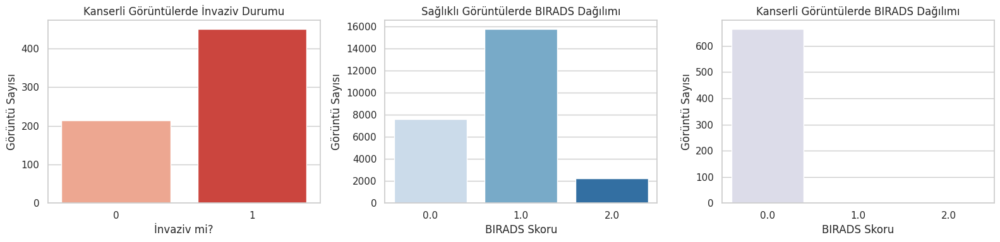

In [21]:
# Eksik değerleri temizle
data_cleaned = data.dropna(subset=['invasive', 'BIRADS'])

# Grafik alanı oluştur
fig, ax = plt.subplots(1, 3, figsize=(16, 4))

# Kanserli görüntülerdeki invaziv durumu
sns.countplot(x='invasive', data=data_cleaned[data_cleaned['cancer'] == True], ax=ax[0], palette='Reds')
ax[0].set_title("Kanserli Görüntülerde İnvaziv Durumu")
ax[0].set_xlabel("İnvaziv mi?")
ax[0].set_ylabel("Görüntü Sayısı")

# Sağlıklı görüntülerde BIRADS dağılımı
sns.countplot(x='BIRADS', data=data_cleaned[data_cleaned['cancer'] == False],
              order=sorted(data_cleaned['BIRADS'].unique()), ax=ax[1], palette='Blues')
ax[1].set_title("Sağlıklı Görüntülerde BIRADS Dağılımı")
ax[1].set_xlabel("BIRADS Skoru")
ax[1].set_ylabel("Görüntü Sayısı")

# Kanserli görüntülerde BIRADS dağılımı
sns.countplot(x='BIRADS', data=data_cleaned[data_cleaned['cancer'] == True],
              order=sorted(data_cleaned['BIRADS'].unique()), ax=ax[2], palette='Purples')
ax[2].set_title("Kanserli Görüntülerde BIRADS Dağılımı")
ax[2].set_xlabel("BIRADS Skoru")
ax[2].set_ylabel("Görüntü Sayısı")

# Düzeni iyileştir ve göster
plt.tight_layout()
plt.show()


BIRADS Değer Anlamı:
0: Gerekli takip
1: Kanser için negatif olarak derecelendirildi
2: Normal olarak derecelendirildi

Kanserli görüntülerin çoğu invazivdir.
Birkaç sağlıklı görüntü takip edilmesine yol açtı.
Tüm kanser görüntülerinin takip edilmesi gerekiyordu.

Makine ID'ye Göre Alınan Görüntü Sayısı
Makine ID'sine göre alınan görüntülerin sıklığını görselleştirerek her makine tarafından ne kadar görüntü alındığını analiz etmek.

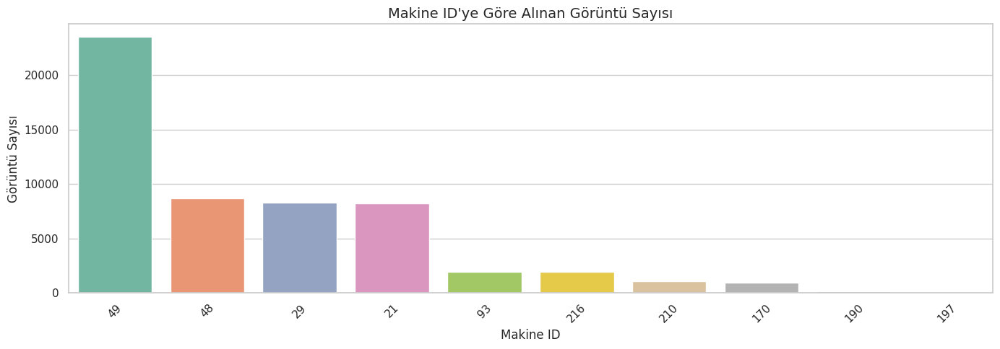

In [22]:
plt.figure(figsize=(14, 5))

# Makine ID'lerini sıklık sırasına göre sırala (opsiyonel ama daha anlamlı olabilir)
ordered_ids = data['machine_id'].value_counts().index

sns.countplot(x='machine_id', data=data, palette='Set2', order=ordered_ids)

plt.title("Makine ID'ye Göre Alınan Görüntü Sayısı", fontsize=14)
plt.xlabel('Makine ID', fontsize=12)
plt.ylabel('Görüntü Sayısı', fontsize=12)

# X ekseni etiketlerini 45 derece döndür (eğer çok fazla ID varsa karışıklığı önler)
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


Görüntüler, toplamda 10 farklı makineden alınmış.
Görüntülerin büyük bir kısmı, 49, 21, 29 ve 48 numaralı makinelerden elde edilmiştir.
Farklı makineler kullanıldığında, görüntülerin dağılımında farklılıklar oluşabilir, bu da analiz ve modelleme süreçlerinde potansiyel bir değişken olabilir.

Görüntü verilerini keşfetme

DICOM (Digital Imaging and Communications in Medicine) Dosyaları:
DICOM, tıbbi görüntüleri ve ilgili bilgileri depolamak, paylaşmak ve iletmek için bir standarttır. Her dosya, hastanın kimlik bilgileri, görüntü türü (örneğin MR, BT) ve görüntü verisi gibi öğeleri içerir. Görüntü verisi genellikle 8 bit veya 16 bit gri tonlamalı ya da 24 bit renkli olabilir.
Özellikler:
Görüntü ve Meta Veriler: Görüntü çözünürlüğü, piksel boyutu gibi bilgiler de içerir.
Uyumluluk: Tıbbi cihazlarla uyumludur ve dünya çapında yaygın olarak kullanılır.
DICOM, hastaneler ve klinikler arasında veri paylaşımını ve doğru tıbbi yorumlamayı sağlar.

In [23]:
!pip install pylibjpeg pylibjpeg-libjpeg pylibjpeg-openjpeg


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.1/62.1 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 36.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 54.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 85.2 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mkl-umath 0.1.1 requires numpy<1.27.0,>=1.26.4, but you have numpy 2.3.0 which is incompatible.
mkl-random 1.2.4 requires numpy<1.27.0,>=1.26.4, but you have numpy 2.3.0 which is incompatible.
mkl-fft 1.3.8 requires numpy<1.27.0,>=1.26.4, but you have numpy 2.3.0 which is incompatible.
cupy-cuda12x 13.4.1 requires numpy<2.3,>=1.22, but you have numpy 2.3.0 wh

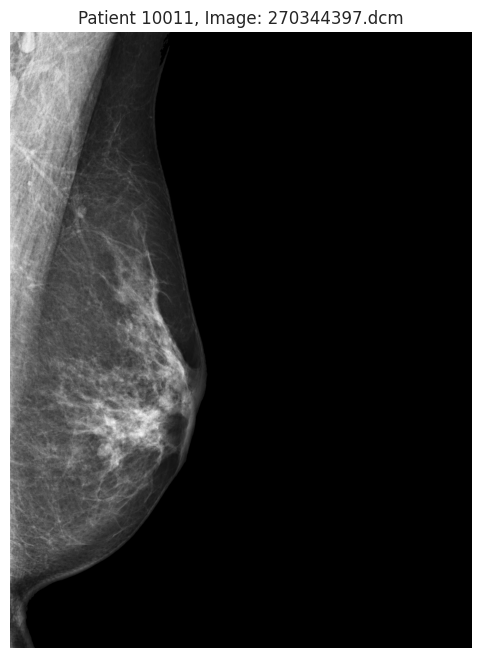

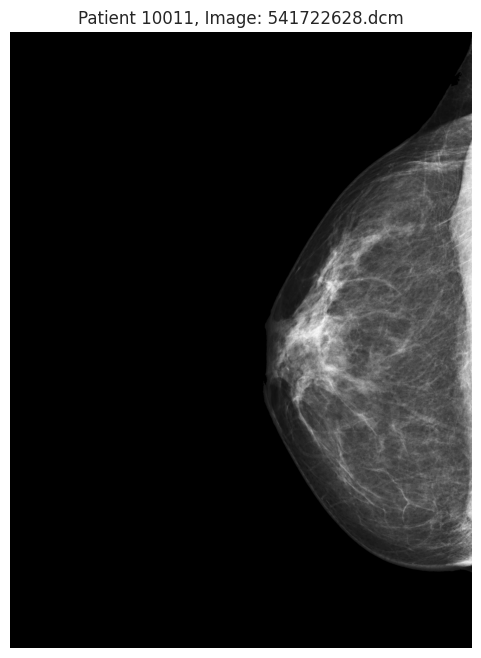

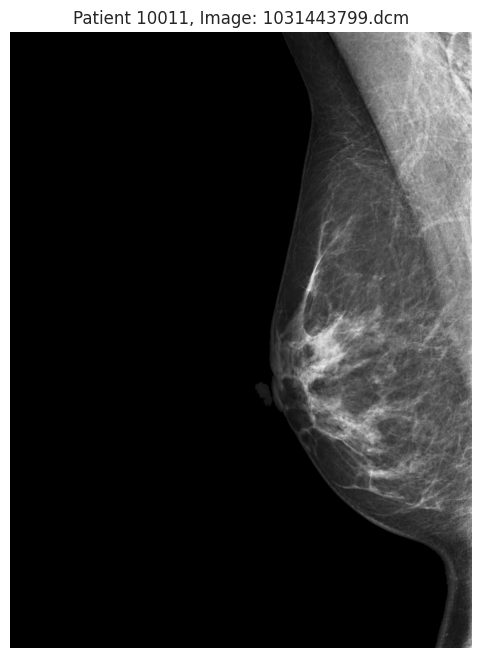

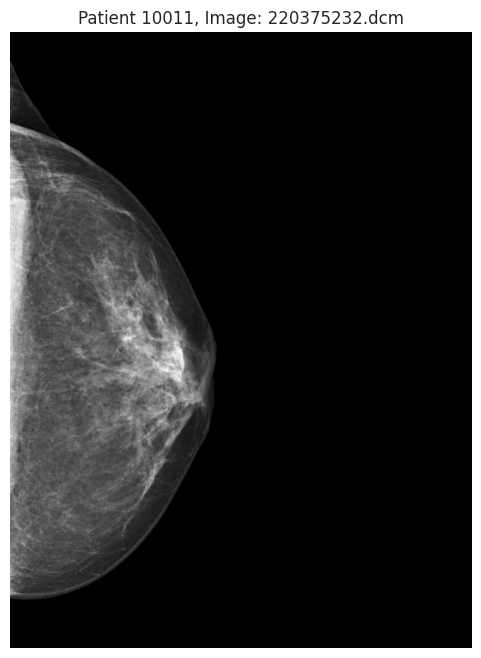

In [24]:
import os
import numpy as np
import pydicom
import cv2
import matplotlib.pyplot as plt

# DICOM dosyalarının bulunduğu dizin
dcm_train_img_path = "/kaggle/input/rsna-breast-cancer-detection/train_images"
patient_id = '10011'  # Örneğin bir hasta ID'si

# Hasta ID'sine ait dizine gidiyoruz
patient_dir = os.path.join(dcm_train_img_path, patient_id)

# Dizin içindeki tüm DICOM dosyalarını listeliyoruz
for dcm_file in os.listdir(patient_dir):
    if dcm_file.endswith(".dcm"):  # Sadece .dcm uzantılı dosyalar
        im = pydicom.dcmread(os.path.join(patient_dir, dcm_file))
        
        # Piksel verisini alıyoruz
        pixels = im.pixel_array

        # Fotometrik yorumlamaya göre işlem yapıyoruz
        if im.PhotometricInterpretation == "MONOCHROME1":
            pixels = np.amax(pixels) - pixels
        else:
            pixels = pixels - np.min(pixels)

        # Normalizasyon işlemi (0-1 aralığı)
        if np.max(pixels) != 0:
            pixels = pixels / np.max(pixels)  # Piksel değerlerini 0-1 aralığına normalize et

        # Görüntüyü 0-255 aralığına çeviriyoruz
        pixels = (pixels * 255).astype(np.uint8)

        # Görüntüyü binarize ediyoruz
        bin_pixels = cv2.threshold(pixels, 20, 255, cv2.THRESH_BINARY)[1]
        
        # Konturları buluyoruz
        contours, _ = cv2.findContours(bin_pixels, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        contour = max(contours, key=cv2.contourArea)
        
        # Maske oluşturuyoruz ve orijinal görüntü ile maskelenmiş kısmı alıyoruz
        mask = np.zeros(pixels.shape, np.uint8)
        cv2.drawContours(mask, [contour], -1, 255, cv2.FILLED)
        out = cv2.bitwise_and(pixels, mask)
        
        # Sonuçları görselleştiriyoruz
        plt.figure(figsize=(6, 8))
        plt.imshow(out, cmap="gray")
        plt.title(f"Patient {patient_id}, Image: {dcm_file}")
        plt.axis('off')
        plt.show()

12. Hastanın DICOM Görüntüsünü Görselleştirme ve Piksel Dağılımını Analiz Etme
Verilen hastanın DICOM görüntülerini yükleyip görselleştirmek, ayrıca görüntünün piksel değerlerinin dağılımını histogram aracılığıyla analiz etmek.

In [25]:
train_path = '/kaggle/input/rsna-breast-cancer-detection/train_images/'
test_path = '/kaggle/input/rsna-breast-cancer-detection/test_images/'

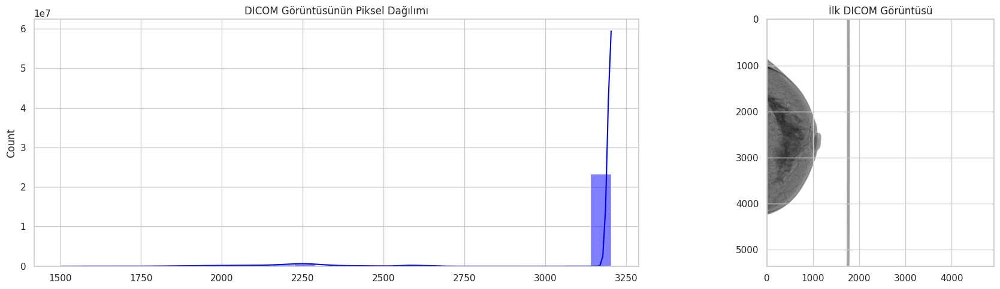

In [26]:
import os
import pydicom
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# DICOM dosyalarını yüklemek için fonksiyon
def load_scans(path, patient_id):
    dcm_path = os.path.join(path, str(patient_id))
    slices = [pydicom.dcmread(os.path.join(dcm_path, file), force=True) 
              for file in os.listdir(dcm_path) if file.endswith(".dcm")]
    return slices

# Örnek hasta ID'si alalım
patient_ids = data.patient_id.unique()

# İlk hasta ID'si ile DICOM dosyalarını yükleyelim
scans = load_scans(train_path, patient_ids[0])

# Görsellerin gösterimi için 1 satır, 2 sütunlu bir grafik ızgarası oluşturuyoruz
fig, ax = plt.subplots(1, 2, figsize=(20, 5))

# Histogram: İlk DICOM görüntüsünün piksel verisini alıyoruz
sns.histplot(scans[0].pixel_array.flatten(), ax=ax[0], kde=True, color='blue')

# Görüntü: İlk DICOM görüntüsünü görselleştiriyoruz
# Görüntü verisini normalize etmeden direk gösterebiliriz, ancak çok karanlık veya çok açık olabilir.
# Normalizasyon yaparak daha iyi bir görünüm elde edebiliriz.
pixels = scans[0].pixel_array
pixels = np.uint8((pixels - np.min(pixels)) / (np.max(pixels) - np.min(pixels)) * 255)

ax[1].imshow(pixels, cmap='gray')

# Başlıkları ekliyoruz
ax[0].set_title("DICOM Görüntüsünün Piksel Dağılımı")
ax[1].set_title("İlk DICOM Görüntüsü")

# Görselleri gösteriyoruz
plt.tight_layout()
plt.show()


Arkaplan piksel değeri sıfırdır, bu da ham piksel verisinin Hounsfield Unit (HU) cinsinden temsil edilmediği anlamına gelir. Bazı piksel değerleri, özellikle yumuşak dokular için beklediğimizden çok daha yüksek olabilir. Bu tutarsızlıkları ortadan kaldırmak ve görüntüleri biyolojik anlamda daha doğru bir şekilde yorumlayabilmek için, görüntülerin HU cinsinden dönüştürülmesi gerekmektedir. HU'ya dönüşüm, özellikle tıbbi görüntüleme verilerinin analizi ve doğru bir şekilde yorumlanması için kritik bir adımdır.

Makine ID'lerine Göre Görüntü Bilgisi Toplama ve Analiz Etme
Farklı makinelerden alınan hasta görüntülerinin mod, satır ve sütun sayılarını analiz ederek, makine bazlı görüntüleme farklılıklarını incelemek.

In [27]:
machine_ids = data.machine_id.unique()
machine_ids


array([ 29,  21, 216,  93,  49,  48, 170, 210, 190, 197])

In [28]:
scans[0].Columns

4915

In [29]:
import os
import pydicom
import numpy as np
import pandas as pd
from scipy.stats import mode  # doğru mod fonksiyonu

# DICOM dosyasındaki bilgileri çıkarmak için fonksiyon
def get_scan_info(scans):
    modes = []  # Piksel yoğunluğu modunu tutacak liste
    rows = []   # Satır sayısını tutacak liste
    cols = []   # Sütun sayısını tutacak liste

    # Her bir DICOM görüntüsünün bilgilerini çıkarıyoruz
    for scan in scans:
        pixel_values = scan.pixel_array.flatten()
        most_common_value = mode(pixel_values, keepdims=False).mode
        modes.append(most_common_value)
        rows.append(scan.pixel_array.shape[0])  # Satır sayısı
        cols.append(scan.pixel_array.shape[1])  # Sütun sayısı
        
    return modes, rows, cols


Piksel dağılımı makine kimliğine göre farklılık göstermektedir. Mod değeri genellikle arka plan piksellerini temsil eder, ancak bazı makinelerde bu değer yüksek çıkabilir (örneğin, 29 ve 210). Fotometrik yorumlama türlerine dikkat edilmelidir: MONOCHROME1'de yüksek değerler parlak piksellere, MONOCHROME2'de ise tersine karşılık gelir. Ayrıca, bazı makineler (örneğin, 29 ve 210) daha yüksek çözünürlük sunar. Bu farklılıkları dikkate alarak, görüntüleri normalleştirmek önemlidir.

Makine Kimliklerine Göre Görüntülerin Görselleştirilmesi
Farklı makine kimliklerine ait tıbbi görüntülerin görselleştirilmesi ve her bir makine için mevcut olan görüntülerin görsel olarak sunulması.

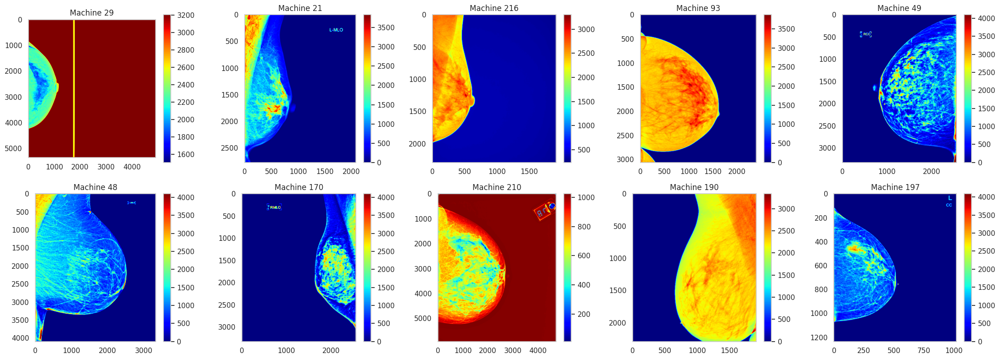

In [30]:
import matplotlib.pyplot as plt
import os
import pydicom

# DICOM dosyasını yüklemek için fonksiyon
def load_patient_scans(path, patient_id):
    dcm_path = os.path.join(path, str(patient_id))
    slices = [pydicom.dcmread(os.path.join(dcm_path, file), force=True) 
              for file in os.listdir(dcm_path) if file.endswith(".dcm")]
    return slices

# Görselleri 2 satır ve 5 sütunluk bir gridde göster
plt.figure(figsize=(22, 8))

# Her bir makine kimliği için döngü başlatıyoruz
for i, m_id in enumerate(machine_ids):  
    patient_ids = data[data['machine_id'] == m_id]['patient_id'].unique()  # Bu makineye ait hasta ID'lerini alıyoruz
    if len(patient_ids) > 0:  # Eğer bu makineye ait en az bir hasta varsa
        try:
            # İlk hastanın taramasını yükle
            scan = load_patient_scans(train_path, patient_ids[0])[0]
            # 2 satır, 5 sütunluk gridde ilgili subgrafiği seç
            plt.subplot(2, 5, i + 1)
            # Görüntüyü 'jet' renk haritası ile göster
            plt.imshow(scan.pixel_array, cmap='jet')
            plt.title(f"Machine {m_id}")  # Makine kimliğini başlık olarak ekle
            plt.colorbar()  # Renk çubuğunu ekle
            plt.grid(False)  # Izgarayı kaldır
        except Exception as e:
            # Tarama yüklenirken hata alındığında mesaj yazdır
            print(f"Error loading scan for Machine {m_id}: {e}")
            plt.subplot(2, 5, i + 1)  # Hata oluşan subgrafiği seç
            plt.text(0.5, 0.5, f"Error: {str(e)}", ha='center', va='center')  # Hata mesajını göster
            plt.axis('off')  # Eksenleri kaldır
    else:  # Eğer hastası yoksa
        plt.subplot(2, 5, i + 1)  # 2 satır, 5 sütunluk gridde ilgili subgrafiği seç
        plt.text(0.5, 0.5, f"No scan available for Machine {m_id}", ha='center', va='center')  # 'No scan available' mesajını göster
        plt.axis('off')  # Eksenleri kaldır

# Grafiklerin düzenini iyileştir
plt.tight_layout()
# Grafiği göster
plt.show()


29 ve 210 numaralı makineler için arka plan değerlerinin farklı olduğu gözlemleniyor. Bu makinelerde en yüksek piksel değeri (beyaz renk) olarak belirlenmişken, diğer makinelerde en düşük piksel değeri (siyah renk) olarak görünüyor. Bu durum, görsellerin işlenmesi sırasında göz önünde bulundurulmalıdır. Ayrıca, bu görseller sadece makine başına birer örnek olup, diğer örneklerde de benzer farklılıklar olabilir.
Fotometrik yorumlama, aşağıdaki formüllerle düzeltilebilir:
MONOCHROME1 için: dizi = dizi.max() - dizi
MONOCHROME2 için: dizi = dizi - dizi.min()
Bu işlemler, tüm görsellerin aynı şekilde yorumlanmasını sağlayarak, her birinin arka planının sıfır yapılmasına olanak tanır.

Görüntü sayısı: 974
Dosya adı.........: /kaggle/input/rsna-breast-cancer-detection/train_images/10706/763186195.dcm
Hasta ID..........: 10706
Görüntü boyutu....: 2776 x 2082, 2645368 bayt
Slice location....: (eksik)


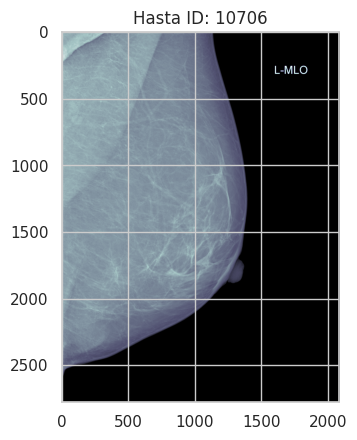

In [31]:
import pydicom as dicom  # pydicom modülünü içeri aktar
import glob as gb
import matplotlib.pyplot as plt

# DICOM dosyalarının bulunduğu dizindeki tüm dosyaları almak
train_images = gb.glob('/kaggle/input/rsna-breast-cancer-detection/train_images/10**/*.dcm', recursive=True)
print("Görüntü sayısı:", len(train_images))

# İlk görüntüyü yükleyelim
filename = train_images[0]
dataset = dicom.dcmread(filename)

# Meta verileri yazdırıyoruz
print("Dosya adı.........:", filename)
print("Hasta ID..........:", dataset.PatientID)

# Eğer 'PixelData' varsa, görüntü boyutlarını ve diğer bilgileri yazdırıyoruz
if 'PixelData' in dataset:
    rows = int(dataset.Rows)
    cols = int(dataset.Columns)
    print(f"Görüntü boyutu....: {rows} x {cols}, {len(dataset.PixelData)} bayt")
    
    if 'PixelSpacing' in dataset:
        print("Pikseller arası mesafe..:", dataset.PixelSpacing)

# Slice location verisi varsa yazdırıyoruz
print("Slice location....:", dataset.get('SliceLocation', "(eksik)"))

# Görüntüyü matplotlib ile gösteriyoruz
plt.imshow(dataset.pixel_array, cmap=plt.cm.bone)
plt.title(f"Hasta ID: {dataset.PatientID}")
plt.show()


In [32]:
m_id_implants = data[data['implant'] == 1]['machine_id'].unique()
print("İmplanta sahip görüntüler şu makinelerden alınmıştır:", m_id_implants)

İmplanta sahip görüntüler şu makinelerden alınmıştır: [ 49 170]


Implant İçeren Hastaların Tarama Görselleştirmesi
Implant içeren hastaların taramalarını görselleştirmek amacıyla, her bir hastanın ilk taramasını yükleyerek, 10 hastanın görüntülerini renkli bir şekilde (jet renk haritası) görselleştirmek.

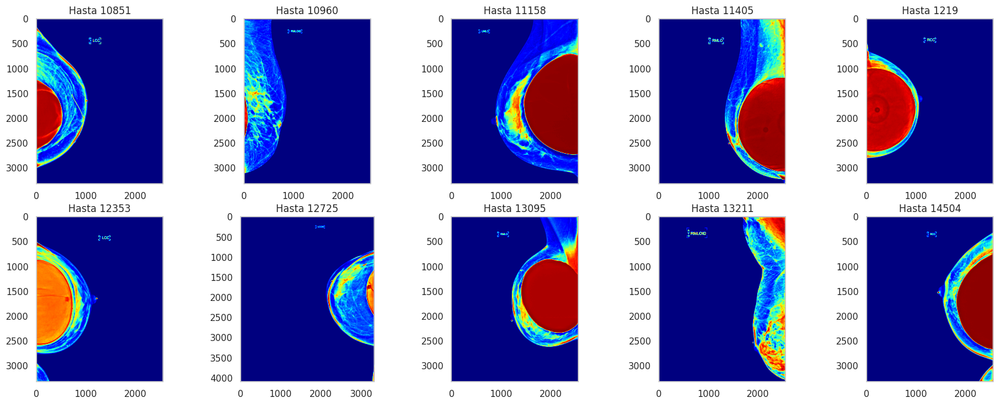

In [33]:
# Implant içeren hastaların benzersiz kimliklerini alıyoruz
patient_ids = data[data['implant'] == 1]['patient_id'].unique()

# Implant içeren taramaları görselleştiriyoruz
plt.figure(figsize=(22, 8))
for i in range(10):
    # Her hastanın ilk taramasını yüklüyoruz
    scan = load_patient_scans(train_path, patient_ids[i])[0] 
    plt.subplot(2, 5, i+1)
    plt.imshow(scan.pixel_array, cmap='jet')  # Taramanın görselini 'jet' renk haritası ile gösteriyoruz
    plt.title(f"Hasta {patient_ids[i]}")  # Başlıkta hastanın ID'sini gösteriyoruz
    plt.grid(False)  # Izgara çizgilerini gizliyoruz
plt.show()


İmplant, memedeki beyaz kitle ile genellikle ayırt edilebilir. Ancak, bazen 10960 ve 13095 numaralı hastalar gibi bazı durumlarda bu ayırt edilebilirlik zorlaşabilir.
Bu nedenle, implantı olan bir hastanın tüm taramalarını inceleyelim.

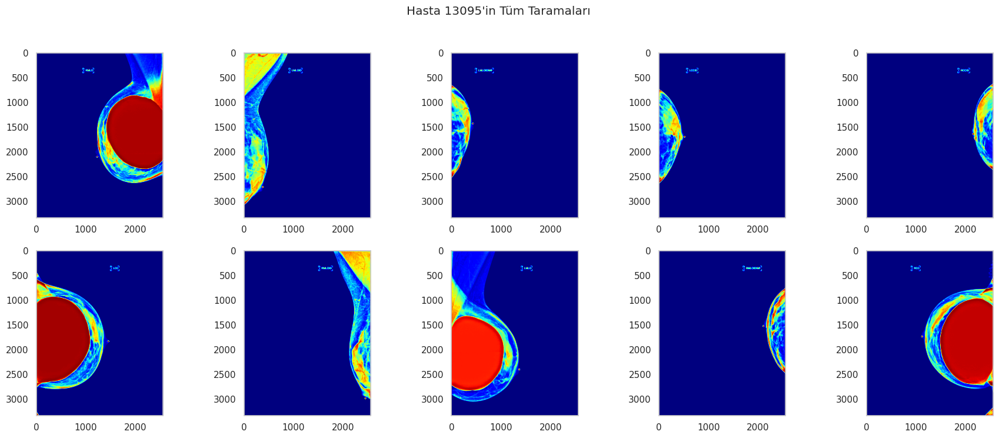

In [34]:
# Hasta 13095'in tüm taramalarını görselleştiriyoruz
plt.figure(figsize=(22, 8))
# Hasta 13095'in taramalarını yüklüyoruz
scans = load_patient_scans(train_path, 13095)

# İlk 10 taramayı görselleştiriyoruz
for i in range(10):
    plt.subplot(2, 5, i+1)  # 2 satır, 5 sütun halinde yerleştiriyoruz
    plt.imshow(scans[i].pixel_array, cmap='jet')  # Taramanın görselini 'jet' renk haritası ile gösteriyoruz
    plt.grid(False)  # Izgara çizgilerini gizliyoruz

# Başlık ekliyoruz
plt.suptitle("Hasta 13095'in Tüm Taramaları")
plt.show()


İmplantları gösteren tüm taramalar, 49 ve 170 numaralı makinelere aittir. İmplantlar bazen yalnızca belirli bir göğüste bulunur ve her iki göğüs de her zaman etkilenmeyebilir. Meta veriler, bir taramanın değil, yalnızca belirli bir hastanın implant taşıyıp taşımadığını belirtir. Bu nedenle, implantsız bir görüntünün mevcut olması olasılığı yüksektir.

Kanserli ve Kansersiz Görüntülerin Görselleştirilmesi
Bu fonksiyon, kanserli veya kansersiz hastaların taramalarını rastgele seçip, görselleri 2 satır ve 5 sütun halinde görselleştirir. Böylece, her iki durumda da görüntülerin karşılaştırılmasını sağlar.

In [35]:
import matplotlib.pyplot as plt
import pydicom
from tqdm import trange

# Kanserli veya kansersiz görüntüleri görselleştiren fonksiyon
def display_cancer_or_not(cancer=True):
    # Kanserli veya kansersiz hastaların rastgele örneklenmiş verilerini seçiyoruz
    cancer_scans = data[data['cancer'] == int(cancer)].sample(frac=1, random_state=0)
    
    # Görselleri göstereceğimiz figure boyutunu belirliyoruz
    plt.figure(figsize=(22, 10))
    
    # Görselleştirilecek tarama sayısını sınırlıyoruz
    num_scans = min(10, len(cancer_scans))
    
    # İlk 10 taramayı görselleştiriyoruz
    for i in trange(num_scans):
        # Hasta ve görüntü ID'sini alıyoruz
        patient = str(cancer_scans.iloc[i][['patient_id']][0])
        file = str(cancer_scans.iloc[i][['image_id']][0]) + '.dcm'
        
        # DICOM dosyasını yüklüyoruz
        try:
            scan = pydicom.dcmread(train_path + '/' + patient + '/' + file)
            
            # 2 satır, 5 sütun halinde yerleştiriyoruz
            plt.subplot(2, 5, i+1)
            
            # Taramanın görselini 'bone' renk haritası ile gösteriyoruz
            plt.imshow(scan.pixel_array, cmap='bone')
            
            # Başlık olarak hasta ve görüntü ID'sini ekliyoruz
            plt.title(f"Patient {patient}\nScan {file}")
            plt.grid(False)  # Izgara çizgilerini gizliyoruz
            
        except Exception as e:
            print(f"Error loading scan for Patient {patient}, Scan {file}: {e}")
    
    # Genel başlık olarak kanser durumu bilgisini ekliyoruz
    plt.suptitle(f"Cancer = {cancer}")
    plt.tight_layout()
    plt.show()


Kanserli Görüntüler
Bu fonksiyon, kanserli hastaların rastgele seçilmiş taramalarını görselleştirir.

100%|██████████| 10/10 [00:07<00:00,  1.36it/s]


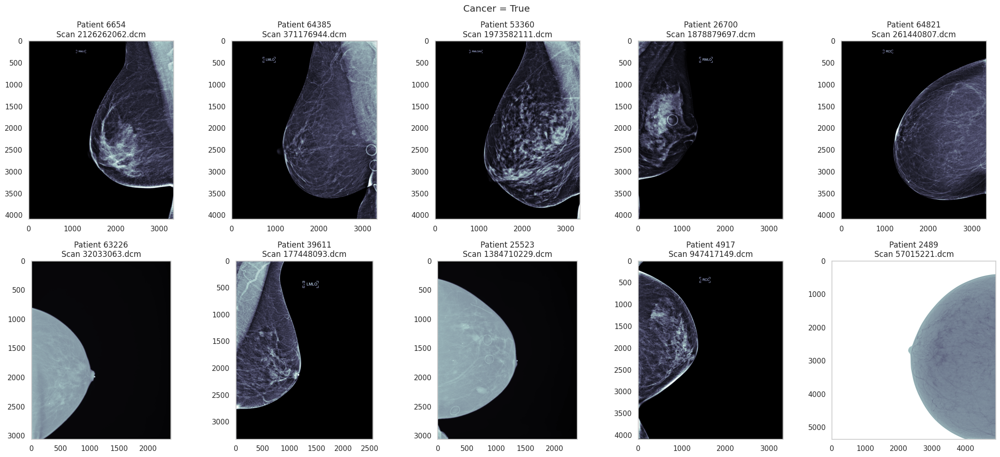

In [36]:
# Images with cancer
display_cancer_or_not(cancer=True)

Kanser Olmayan Görüntüler
Bu fonksiyon, kansersiz hastaların rastgele seçilmiş taramalarını görselleştirir.

100%|██████████| 10/10 [00:06<00:00,  1.55it/s]


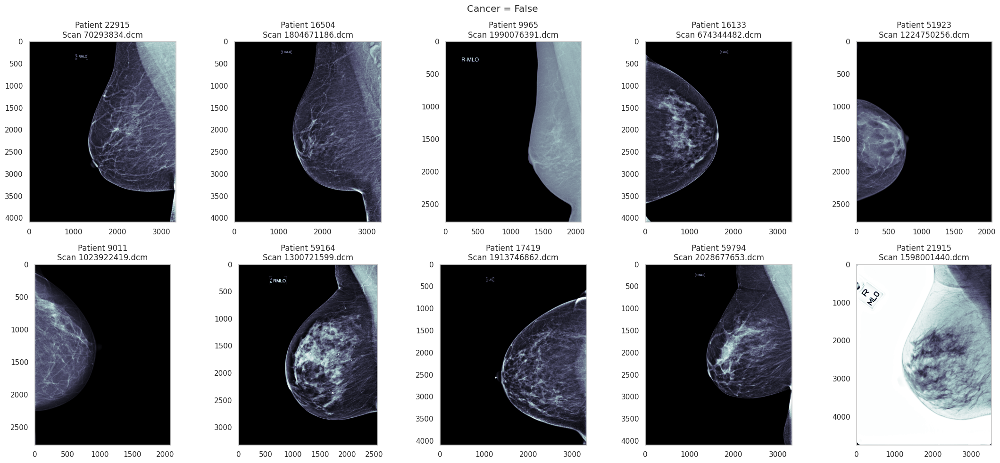

In [37]:
# Images without cancer
display_cancer_or_not(cancer=False)

Kanserli ve sağlıklı görüntüler arasındaki farkları gözle ayırt etmek zor. Ayrıca, farklı makine kimlikleri nedeniyle piksel dağılımları da değişiyor.

Aykırı Değer Analizi:
Model performansını iyileştirmek için aykırı değerleri tespit edip çıkarabiliriz. Bunun için, görüntülerdeki piksellerin dağılımını analiz ederek normdan sapmaları belirleyebiliriz. İlk adım olarak, makine kimliği 21'e ait hastaların ilk taramalarında bu analizi yapacağım. Hesaplama süresi için daha küçük, önceden işlenmiş 256x256 boyutlarındaki görüntüleri kullanacağım.

Hasta ve görüntü ID'lerine göre dosya yollarını oluşturur ve bunları path sütununa ekler.

In [38]:
data['png_256_path'] = "/kaggle/input/rsna-breast-cancer-256-pngs/" + data.patient_id.astype(str) + "_" + data.image_id.astype(str) + ".png"

Aykırı Değer Analizi ve İstatistiksel Görüntü Verileri
Makine kimliği 21'e ait hastaların görüntülerinin istatistiksel analizini yaparak, her bir hastanın görüntülerine ait temel istatistiksel özellikleri (ortalama, medyan, standart sapma, çarpıklık) hesaplamak ve bu verileri analiz etmek. Bu, aykırı değerleri tespit etme ve gelecekteki model performansını iyileştirme için bir temel oluşturur.

In [39]:
import cv2
import numpy as np
import pandas as pd
from tqdm import trange
from scipy.stats import skew

# Görsellerin bulunduğu dizinin yolu
source = '../input/rsna-breast-cancer-256-pngs/'

# 'path' sütununu oluşturuyoruz
data['path'] = source + data['patient_id'].astype(str) + "_" + data['image_id'].astype(str) + ".png"

# Machine ID 21'e ait tüm hastalar
patients = data[data.machine_id == 21].patient_id.unique()

# İstatistiksel veriler için boş listeler oluşturuluyor
means, medians, stds, skews_vals, paths, labels = [], [], [], [], [], []

# Her bir hastanın görüntüsünü işliyoruz
for i in trange(len(patients)):
    path = data[data['patient_id'] == patients[i]]['path'].iloc[0]  # Görüntü yolu
    label = data[data['patient_id'] == patients[i]]['cancer'].iloc[0]  # Kanser durumu
    
    try:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  # Görüntüyü gri tonlama olarak okuma
        if img is None:
            print(f"Error: {path} could not be loaded.")
            continue
        
        # İstatistiksel hesaplamalar
        means.append(np.mean(img))  # Ortalama hesaplanıyor
        medians.append(np.median(img))  # Medyan hesaplanıyor
        stds.append(np.std(img))  # Standart sapma hesaplanıyor
        skews_vals.append(skew(img, axis=None))  # Çarpıklık hesaplanıyor
        paths.append(path)  # Görüntü yolu
        labels.append(label)  # Kanser durumu
        
    except Exception as e:
        print(f"Error processing patient {patients[i]}: {e}")
        continue

# İstatistiksel veriler DataFrame'e ekleniyor
stats = pd.DataFrame({
    'mean': means,
    'median': medians,
    'std': stds,
    'skew': skews_vals,
    'path': paths,
    'cancer': labels
})

# Sonuçların ilk 5 satırını gösteriyoruz
print(stats.head())


100%|██████████| 2000/2000 [00:27<00:00, 72.91it/s]

        mean  median        std      skew  \
0  23.519974     0.0  44.307665  1.898121   
1  61.903717     0.0  71.144194  0.336840   
2  48.547485    21.0  56.666901  0.904618   
3  43.495071     0.0  63.308430  1.288435   
4  51.479340     0.0  68.508061  0.629936   

                                                path  cancer  
0  ../input/rsna-breast-cancer-256-pngs/10011_220...       0  
1  ../input/rsna-breast-cancer-256-pngs/10106_238...       0  
2  ../input/rsna-breast-cancer-256-pngs/10144_126...       0  
3  ../input/rsna-breast-cancer-256-pngs/1015_3356...       0  
4  ../input/rsna-breast-cancer-256-pngs/10179_760...       0  


İstatistiksel Veriler ile 3D Dağılım Görselleştirmesi
Makine Kimliği 21'e ait hastaların görüntülerinin istatistiksel verilerini (ortalama, standart sapma, çarpıklık) kullanarak, bu verilerin 3D bir dağılım grafiğinde görselleştirilmesi ve kanserli ile kansersiz görüntülerin karşılaştırılması amaçlanmıştır.

In [40]:
import plotly.express as px

# 3D dağılım grafiği oluşturuluyor
fig = px.scatter_3d(stats, x='mean', y='std', z='skew', color='median')

# Grafik gösteriliyor
fig.show()


Ortanca değerlere bakıldığında, farklı grupların bulunduğu görülmektedir. En yüksek ortanca değeri sıfıra yakın olup, bu da piksellerin büyük kısmının arka planda olduğunu gösterir. Turuncu noktalar ise, göğsün piksellerin çoğunu kapladığı görüntüleri temsil eder. Bu tür görüntülerin ortalama değerleri de daha yüksektir, bu da beklenen bir durumdur. Eğrilik, ortalama değeriyle ve dolayısıyla göğüs boyutuyla ilişkilidir.

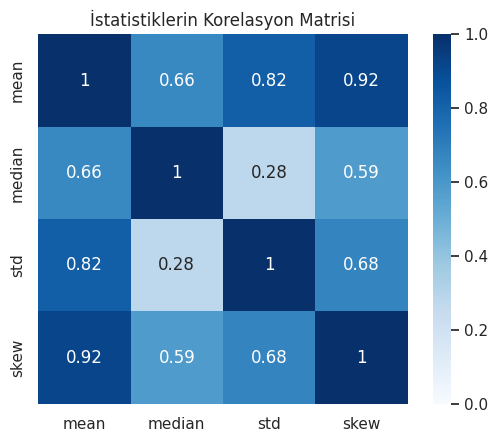

In [41]:
# Korelasyon hesaplamak için sadece sayısal sütunları kullanıyoruz
numerical_stats = stats.drop(columns=['path', 'cancer'])

# Korelasyon matrisini hesapla ve görselleştir
sns.heatmap(np.abs(numerical_stats.corr()), annot=True,
            square=True, vmin=0, vmax=1, cmap='Blues')

plt.title("İstatistiklerin Korelasyon Matrisi")
plt.show()


Ortalama ve çarpıklık arasında güçlü bir ilişki bulunurken, standart sapma ve medyanın ilişkisi zayıftır. Bu istatistiklere dayanarak kanser tahmin etmek mümkün değildir. Bunun yerine, benzer görüntüleri gruplamak için Gauss karışım modeli (GMM) kullanılabilir. Scikit-learn ile uygulanan bu model, görüntüleri anlamlı kümelere ayırır ve görselleştirerek grupları daha net şekilde analiz etmemizi sağlar.

Veri setindeki öznitelikleri standartlaştırarak, Gaussian Mixture Model (GMM) ile kümelere ayırmak ve bu kümeleri 3D grafikte görselleştirerek benzer özelliklere sahip verileri gruplandırmak.

Gaussian Mixture Model (GMM) ile Kümeleme Sonuçlarına Göre Görsellerin Görselleştirilmesi
Gaussian Mixture Model (GMM) ile kümelenmiş verilerden her küme için rastgele seçilen ilk 10 görüntüyü 4 sütunlu ve 10 satırlı bir alt grafik düzeni ile görselleştirerek, kümeler arasındaki farklılıkları ve kanser durumlarını görsel olarak incelemek.

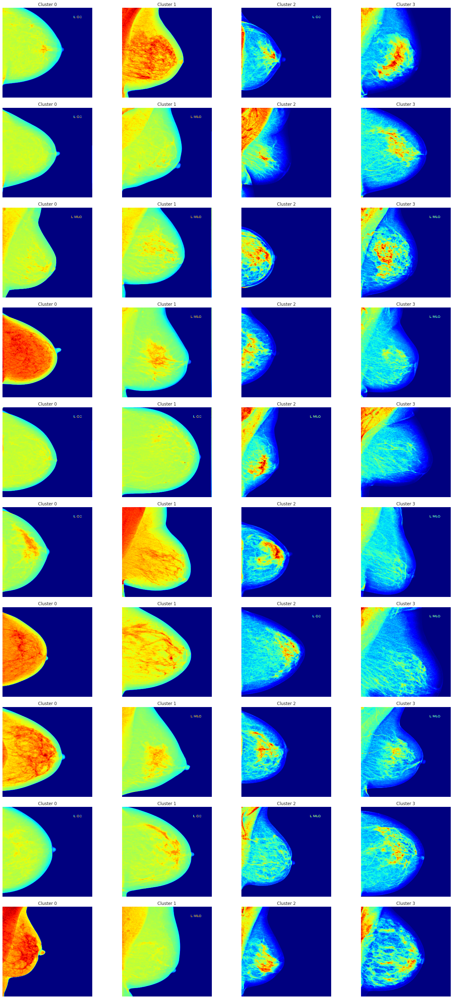

In [42]:
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
from PIL import Image

# Veriyi standartlaştırma (Özniteliklerin ölçeklendirilmesi)
scaler = StandardScaler()
X = stats.drop(['path', 'cancer'], axis=1)  # 'path' ve 'cancer' sütunlarını veriden çıkarıyoruz
X = scaler.fit_transform(X)  # Veriyi standartlaştırıyoruz

# Gaussian Mixture Model (GMM) ile kümeleme
gmm = GaussianMixture(n_components=4, random_state=0)  # 4 farklı küme oluşturulacak
stats['cluster_label'] = gmm.fit_predict(X)  # Veriye küme etiketleri ekleniyor

# 3D görselleştirme: Küme etiketlerine göre renk ayrımı yapılacak
fig = px.scatter_3d(stats, x='mean', y='std', z='skew', color='cluster_label')
fig.show()  # Grafik görüntüleniyor

# Görsellerin düzeni için figure boyutunu belirliyoruz
fig, ax = plt.subplots(10, 4, figsize=(20, 40))

# Benzersiz cluster etiketlerinin sayısını alıyoruz
num_clusters = stats['cluster_label'].nunique()

# Her bir cluster etiketi için döngü başlatıyoruz
for l in range(num_clusters):
    # İlgili cluster'a ait görsellerin yollarını alıyoruz
    img_paths = stats[stats.cluster_label == l].path.values[:10]  # İlk 10 görsel

    # Her bir görseli yerleştiriyoruz
    for n in range(len(img_paths)):
        try:
            # Görseli yüklüyoruz
            image = Image.open(img_paths[n])

            # Görseli belirli bir subgrafikte yerleştiriyoruz
            ax[n, l].imshow(image, cmap='jet')

            # Başlık olarak cluster etiketini ekliyoruz
            ax[n, l].set_title(f"Cluster {l}", fontsize=12)
        except Exception as e:
            # Eğer görsel yüklenemezse, o görseli atlıyoruz ve hata mesajı veriyoruz
            print(f"Error loading image {img_paths[n]}: {e}")
            continue
        
        # Eksenleri gizliyoruz
        ax[n, l].axis('off')

# Düzenli bir şekilde görsellerin yerleşmesini sağlıyoruz
plt.tight_layout()
plt.show()


Belirli bir etiket için (bir sütun boyunca) görüntüler piksel dağılımlarında oldukça benzerdir. Karşıtlıklar kümeler arasında değişir. 

Aykırı Değer Analizi ve Log-Olasılık Hesaplama
Gaussian Mixture Model (GMM) kullanılarak her bir örneğin log-olasılık değerleri hesaplanacak ve ardından log-olasılık değerlerinin %0,5'lik kantili (en düşük %0,5'lik değer) belirlenecektir. Bu değer, aykırı örnekleri tanımlamak için kullanılacaktır.

In [43]:
np.unique(stats.cancer)

array([0, 1])

Index(['mean', 'median', 'std', 'skew', 'path', 'cancer', 'cluster_label'], dtype='object')


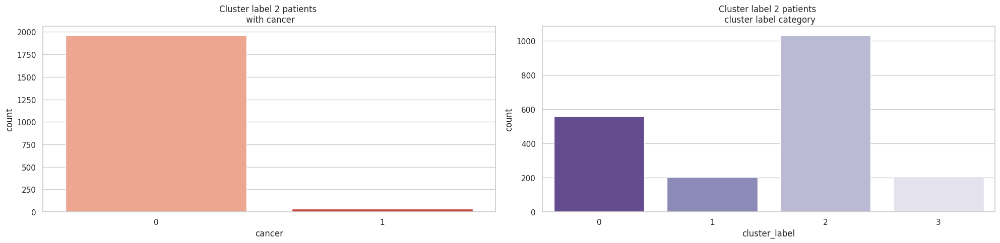

Log-likelihood %0.5'lik kuantil: -21.384342447945176


In [44]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture

# Cluster 2'deki yüksek yoğunluklu hastalar
high_intensity_patients = stats[stats.cluster_label == 2].index.values

# Sütun adlarını kontrol ediyoruz
print(stats.columns)  # Burada 'selection' yerine 'stats' kullanmalısınız

# Görselleştirme için uygun sütun isimlerini kullanalım
fig, ax = plt.subplots(1, 2, figsize=(20, 5))

# 'cancer' sütununu kullanalım (implant yerine)
sns.countplot(x='cancer', data=stats, ax=ax[0], palette='Reds')

# 'cluster_label' sütununu kullanalım (density yerine)
sns.countplot(x='cluster_label', data=stats, ax=ax[1], palette='Purples_r')

# Başlıkları ekliyoruz
ax[0].set_title('Cluster label 2 patients \n with cancer')
ax[1].set_title('Cluster label 2 patients \n cluster label category')

# Görselleri gösteriyoruz
plt.tight_layout()
plt.show()

# GMM modelini kullanarak her bir örnek için log-likelihood değerlerini hesaplıyoruz
# X verisini doğru şekilde tanımlayın (örneğin, 'mean', 'median' vb. sütunlardan bir veri kümesi)
X = stats[['mean', 'median', 'std', 'skew']].values  # Bu sütunları kullanarak bir veri kümesi oluşturabilirsiniz

gmm = GaussianMixture(n_components=4, random_state=0)
gmm.fit(X)  # X verisini doğru şekilde eğitmeniz gerekiyor

# Her bir örnek için log-likelihood değerlerini hesaplıyoruz
stats['logL'] = gmm.score_samples(X)  # 'X' veri kümesi doğru tanımlanmalı

# Hesaplanan log-likelihood değerlerinin %0.5'lik kuantilini (en düşük %0.5'lik değerini) buluyoruz
quantile_value = stats['logL'].quantile(0.005)
print(f"Log-likelihood %0.5'lik kuantil: {quantile_value}")


İlgilendiğimiz uç değerlerin logL değerinin -10'dan küçük olduğunu ve bunları görüntüleyebileceğimizi varsayalım.

Index(['mean', 'median', 'std', 'skew', 'path', 'cancer', 'cluster_label',
       'logL'],
      dtype='object')


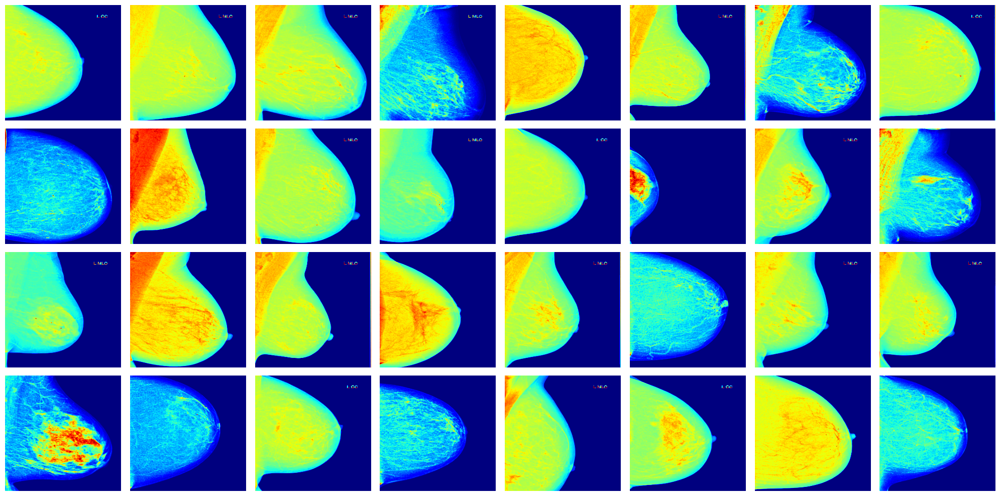

In [45]:
import matplotlib.pyplot as plt
from PIL import Image

# Aykırı değerlerin sayısını kontrol et
outliers = stats[stats.logL < -10].sort_values(by='logL')
num_outliers = len(outliers)

# Sütun adlarını kontrol ediyoruz
print(outliers.columns)  # 'path' ve 'logL' sütunlarını kontrol edin

# 4x8 grid içinde görselleri görselleştirmek için bir figure ve axes oluşturuyoruz
fig, ax = plt.subplots(4, 8, figsize=(20, 10))

# 4 satır ve 8 sütun için her bir alt grafik üzerinde görseli gösteriyoruz
for n in range(4):
    for m in range(8):
        # Görseli yüklemek için gridin içinde geçerli bir indeksi kontrol ediyoruz
        index = 8 * n + m
        if index < num_outliers:
            # Görsel yolları 'path' sütununda yer alıyor
            image_path = outliers.path.values[index]
            image = Image.open(image_path)
        
            # Görseli boyutlandırarak gösterelim (isteğe bağlı)
            image = image.resize((256, 256))  # Görselleri 256x256 boyutlarına yeniden boyutlandırıyoruz
            
            # Görseli gösteriyoruz ve eksenleri gizliyoruz
            ax[n, m].imshow(image, cmap='jet')
            ax[n, m].axis('off')  # Eksenleri gizliyoruz
        else:
            # Eğer daha fazla görsel yoksa, eksenleri gizliyoruz
            ax[n, m].axis('off')

# Grafiklerin düzenli bir şekilde yerleşmesini sağlıyoruz
plt.tight_layout()  
plt.show()


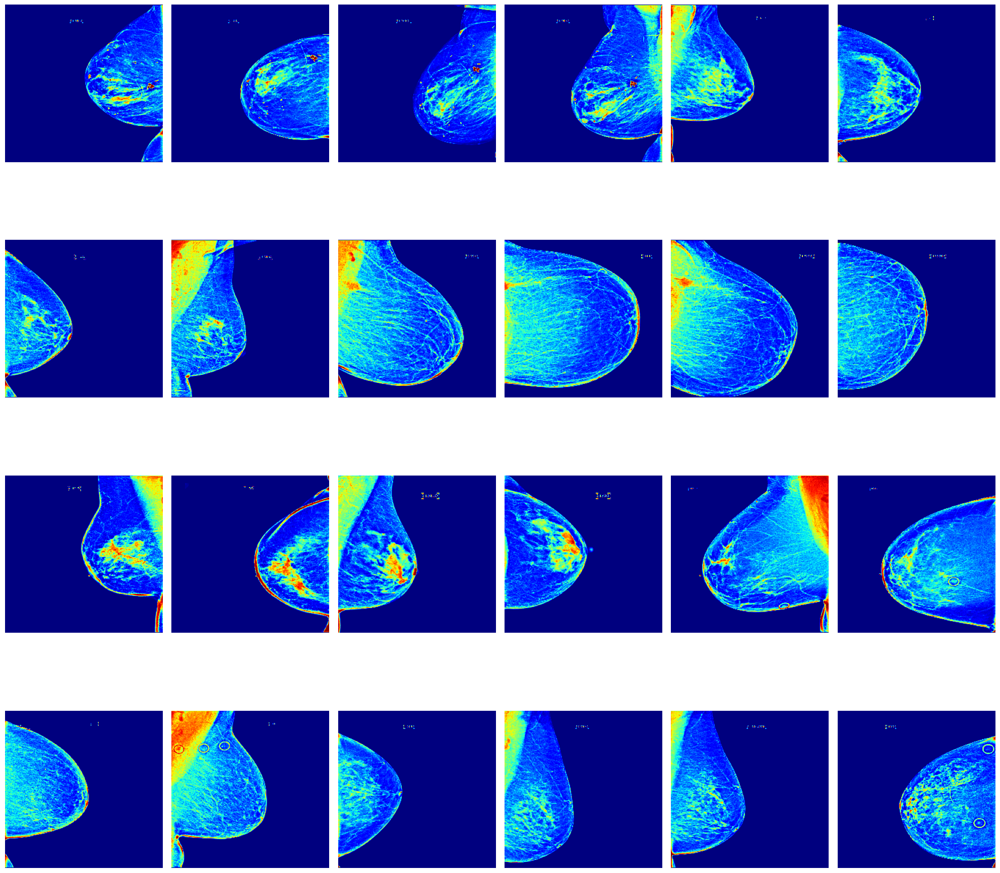

In [46]:
import matplotlib.pyplot as plt
from PIL import Image

# Görselleri yerleştireceğimiz figure boyutlarını belirliyoruz
N = 6  # Sütun sayısı
M = 4  # Satır sayısı

# machine_id=49 ve cancer=1 olan verileri seçiyoruz
selection = data[(data.machine_id == 49) & (data.cancer == 1)]

# 4 satır ve 6 sütunluk bir grid oluşturuyoruz
fig, ax = plt.subplots(M, N, figsize=(20, 20))

# Görselleri gridin her bir hücresine yerleştiriyoruz
for m in range(M):
    for n in range(N):
        # Seçilen görsellerin yolunu alıyoruz
        image_index = m * N + n  # Görsel indeksleme düzene göre
        if image_index < len(selection):
            image_path = selection['png_256_path'].values[image_index]  # 'png_256_path' sütununu kullanıyoruz
            # Görseli yüklüyoruz
            image = Image.open(image_path)
            # Görseli gösteriyoruz
            ax[m, n].imshow(image, cmap='jet')
        # Eksenleri gizliyoruz
        ax[m, n].axis("off")

# Grafik düzeninin düzgün bir şekilde yerleşmesini sağlıyoruz
plt.tight_layout()
plt.show()


Aykırı değerler, genellikle çok fazla arka plan içeren veya sadece küçük bir yüzey alanına sahip olan görüntülerdir. Bunun dışında, piksel yoğunluğunda özel kontrastlara sahip olan görüntüler de aykırı değer olarak kabul edilebilir. Ayrıca, farklı makine kimliklerinden gelen veriler ve belirli bir hasta için tüm tarama seti göz önünde bulundurulduğunda, daha fazla aykırı değer tespit edilebilir.

Veri seti, kanserli ve kansersiz taramalar arasında oldukça dengesizdir.
Hastaların çoğu 40 yaşın üzerindedir.
Görüntüler oldukça büyüktür ve ön işleme sırasında yeniden ölçeklendirilmesi gerekecektir.
Piksel dağılımları, kullanılan makine kimliğine bağlı olarak önemli ölçüde değişir.
Veri seti, implantları gösteren görüntüler açısından da dengesizdir.

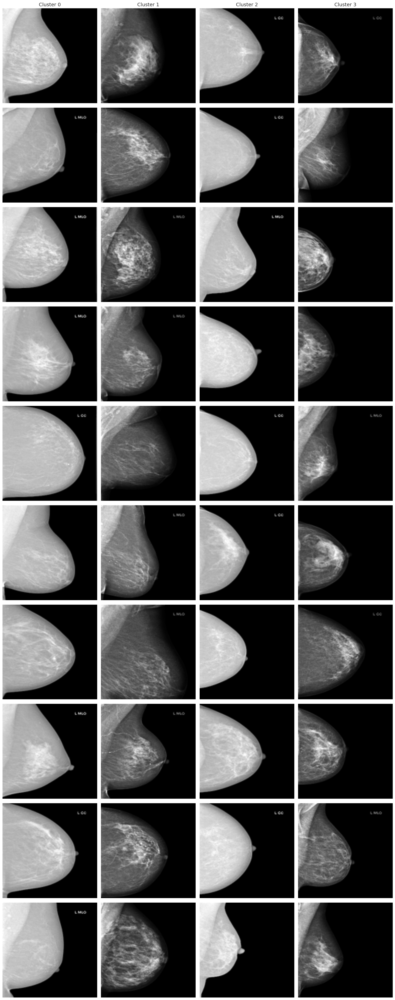

In [47]:
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
from PIL import Image

# 1. Veriyi hazırla: 'path' ve sınıf etiketi olan 'cancer' sütunlarını çıkar, geri kalan özellikleri al
X = stats.drop(['path', 'cancer'], axis=1)

# 2. Özellikleri standartlaştır (ortalama=0, std=1)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Gaussian Mixture Model ile kümeleme yap (4 küme varsayalım)
gmm = GaussianMixture(n_components=4, random_state=42)
cluster_labels = gmm.fit_predict(X_scaled)

# 4. Küme etiketlerini orijinal veri çerçevesine ekle
stats['cluster_label'] = cluster_labels

# 5. Her kümeden 10 temsilci görseli yan yana göstermek için figure oluştur
fig, axes = plt.subplots(10, 4, figsize=(16, 40))  # 10 satır, 4 sütun (4 küme)

for cluster in range(4):
    # İlgili kümedeki görsel yollarını al (ilk 10 görsel)
    cluster_images = stats[stats['cluster_label'] == cluster]['path'].values[:10]

    for i, img_path in enumerate(cluster_images):
        try:
            # Görseli yükle ve boyutlandır
            img = Image.open(img_path).resize((128, 128))
            axes[i, cluster].imshow(img, cmap='gray')
            axes[i, cluster].axis('off')

            # İlk satırda küme başlığı ekle
            if i == 0:
                axes[i, cluster].set_title(f'Cluster {cluster}', fontsize=14)
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            axes[i, cluster].axis('off')

# Grafikler arası boşlukları optimize et
plt.tight_layout()
plt.show()


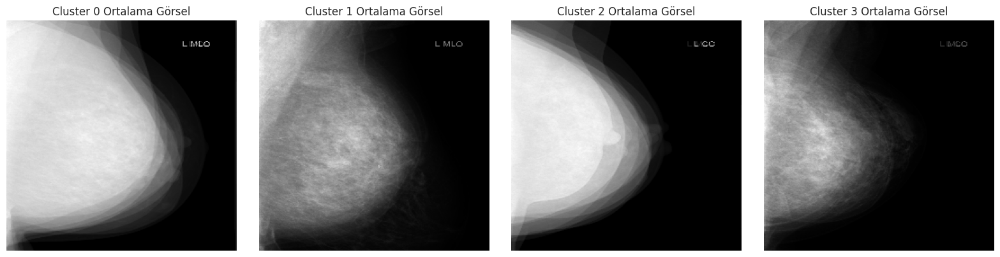

In [48]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

num_clusters = stats['cluster_label'].nunique()
images_per_cluster = 10  # Her kümeden kullanılacak görsel sayısı

fig, ax = plt.subplots(1, num_clusters, figsize=(4*num_clusters, 4))

for cluster_id in range(num_clusters):
    # O kümedeki görsellerin path'lerini al
    cluster_images_paths = stats[stats['cluster_label'] == cluster_id]['path'].values[:images_per_cluster]
    
    # Görselleri numpy dizilerine çevir ve topla
    imgs = []
    for path in cluster_images_paths:
        img = Image.open(path).convert('L').resize((256,256))  # Gri tonlama ve standart boyut
        imgs.append(np.array(img))
    
    if len(imgs) == 0:
        continue
    
    # Ortalama görseli hesapla
    mean_img = np.mean(imgs, axis=0)
    
    # Ortalama görseli göster
    ax[cluster_id].imshow(mean_img, cmap='gray')
    ax[cluster_id].set_title(f'Cluster {cluster_id} Ortalama Görsel')
    ax[cluster_id].axis('off')

plt.tight_layout()
plt.show()


Eksik density değerine sahip satırlar veri setinden çıkarıldı.
density sütunu sayısal forma dönüştürüldü.
Gereksiz olan implant sütunu veri setinden kaldırıldı.

In [49]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# CSV dosyasını oku
filepath = '/kaggle/input/rsna-breast-cancer-detection/train.csv'
data = pd.read_csv(filepath)

# Eksik 'density' değerlerini kaldır
total_rows_before = len(data)
data_cleaned = data.dropna(subset=['density']).copy()
total_rows_after = len(data_cleaned)

print("Eksik 'density' değerleri kaldırılmadan önceki satır sayısı:", total_rows_before)
print("Eksik 'density' değerleri kaldırıldıktan sonraki satır sayısı:", total_rows_after)


# 'density' sütununu sayısal hale getir
label_encoder = LabelEncoder()
data_cleaned['density_encoded'] = label_encoder.fit_transform(data_cleaned['density'])

# 'density_encoded' sütununun eklendiğini kontrol et
print(data_cleaned.head())


Eksik 'density' değerleri kaldırılmadan önceki satır sayısı: 54706
Eksik 'density' değerleri kaldırıldıktan sonraki satır sayısı: 29470
    site_id  patient_id    image_id laterality view   age  cancer  biopsy  \
12        1       10038  1967300488          L  MLO  60.0       0       0   
13        1       10038  2142944869          L   CC  60.0       0       0   
14        1       10038   850559196          R  MLO  60.0       0       0   
15        1       10038  1350492010          R   CC  60.0       0       0   
16        1       10042   102733848          L   CC  51.0       0       0   

    invasive  BIRADS  implant density  machine_id  difficult_negative_case  \
12         0     1.0        0       C         216                    False   
13         0     1.0        0       C         216                    False   
14         0     1.0        0       C         216                    False   
15         0     1.0        0       C         216                    False   
16         

In [50]:
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Silme işleminden önceki toplam satır sayısı
satir_sayisi_once = len(data_cleaned)
print("İmplantlar kaldırılmadan önceki toplam satır sayısı:", satir_sayisi_once)

# İmplant içeren satır sayısı
implant_sayisi = data_cleaned[data_cleaned['implant'] == 1].shape[0]
print("İmplant içeren satır sayısı (implant == 1):", implant_sayisi)

# İmplant içeren satırları kaldır
data_cleaned = data_cleaned[data_cleaned['implant'] == 0]

# Silme işleminden sonraki toplam satır sayısı
satir_sayisi_sonra = len(data_cleaned)
print("İmplantlar kaldırıldıktan sonraki toplam satır sayısı:", satir_sayisi_sonra)

# İlk birkaç satırı göstererek değişiklikleri doğrula
data_cleaned.head()


İmplantlar kaldırılmadan önceki toplam satır sayısı: 29470
İmplant içeren satır sayısı (implant == 1): 1460
İmplantlar kaldırıldıktan sonraki toplam satır sayısı: 28010


,site_id,patient_id,image_id,laterality,view,age,cancer,biopsy,invasive,BIRADS,implant,density,machine_id,difficult_negative_case,density_encoded
12,1,10038,1967300488,L,MLO,60.0,0,0,0,1.0,0,C,216,False,2
13,1,10038,2142944869,L,CC,60.0,0,0,0,1.0,0,C,216,False,2
14,1,10038,850559196,R,MLO,60.0,0,0,0,1.0,0,C,216,False,2
15,1,10038,1350492010,R,CC,60.0,0,0,0,1.0,0,C,216,False,2
16,1,10042,102733848,L,CC,51.0,0,0,0,1.0,0,C,93,False,2


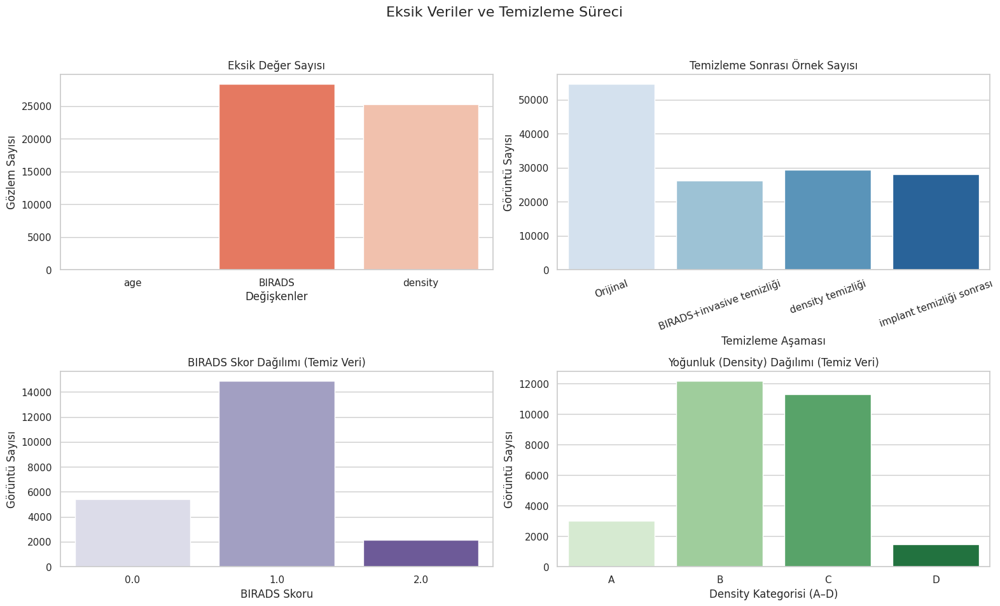

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Stil ayarı
sns.set(style="whitegrid")
plt.rcParams["font.size"] = 11

# 1. Eksik veri sayısını görselleştir
missing_values = data[['age', 'BIRADS', 'density']].isna().sum()

# 2. Temizleme öncesi ve sonrası örnek sayıları
counts = {
    'Orijinal': len(data),
    'BIRADS+invasive temizliği': len(data.dropna(subset=['invasive', 'BIRADS'])),
    'density temizliği': len(data.dropna(subset=['density'])),
    'implant temizliği sonrası': len(data_cleaned)
}

# 3. Density ve BIRADS dağılımı (temiz veri üzerinden)
birads_counts = data_cleaned['BIRADS'].value_counts().sort_index()
density_counts = data_cleaned['density'].value_counts().sort_index()

# Grafik düzeni: 2x2
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle("Eksik Veriler ve Temizleme Süreci", fontsize=16)

# (1) Eksik veri sayısı
sns.barplot(x=missing_values.index, y=missing_values.values, ax=axs[0, 0], palette='Reds_r')
axs[0, 0].set_title("Eksik Değer Sayısı")
axs[0, 0].set_ylabel("Gözlem Sayısı")
axs[0, 0].set_xlabel("Değişkenler")

# (2) Temizleme adımlarına göre örnek sayıları
sns.barplot(x=list(counts.keys()), y=list(counts.values()), ax=axs[0, 1], palette='Blues')
axs[0, 1].set_title("Temizleme Sonrası Örnek Sayısı")
axs[0, 1].set_ylabel("Görüntü Sayısı")
axs[0, 1].set_xlabel("Temizleme Aşaması")
axs[0, 1].tick_params(axis='x', rotation=20)

# (3) BIRADS dağılımı
sns.countplot(x='BIRADS', data=data_cleaned, palette='Purples', ax=axs[1, 0])
axs[1, 0].set_title("BIRADS Skor Dağılımı (Temiz Veri)")
axs[1, 0].set_xlabel("BIRADS Skoru")
axs[1, 0].set_ylabel("Görüntü Sayısı")

# (4) Density dağılımı
sns.countplot(x='density', data=data_cleaned, palette='Greens', ax=axs[1, 1],
              order=sorted(data_cleaned['density'].unique()))
axs[1, 1].set_title("Yoğunluk (Density) Dağılımı (Temiz Veri)")
axs[1, 1].set_xlabel("Density Kategorisi (A–D)")
axs[1, 1].set_ylabel("Görüntü Sayısı")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


In [52]:
base_path = '/kaggle/input/rsna-breast-cancer-256-pngs'
data_cleaned['image_path'] = data_cleaned.apply(
    lambda row: f"{base_path}/{row['patient_id']}_{row['image_id']}.png", axis=1)

data_cleaned.to_csv('/kaggle/working/data_preprocessed.csv', index=False)


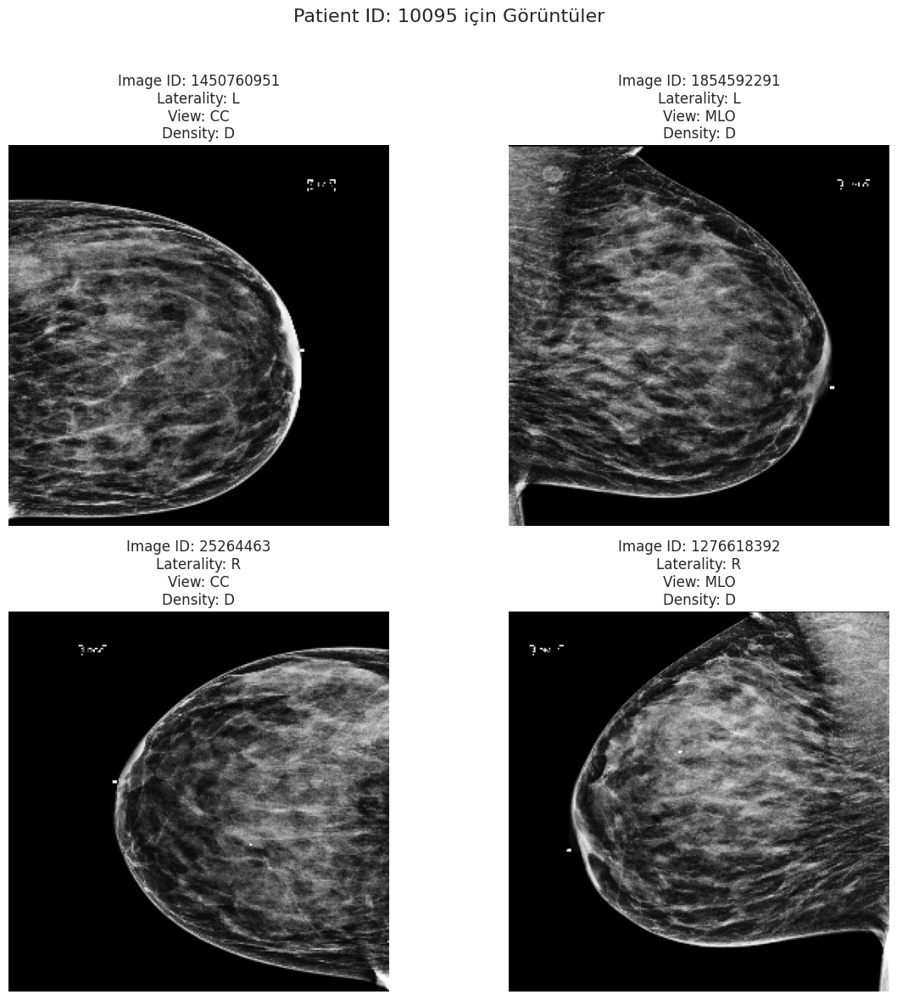

In [53]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Görüntülemek için hasta ID'sini belirt
hasta_id_to_display = 10095  

# Belirli hasta ve gerekli görüntüler için filtreleme yap
hasta_verisi = data_cleaned[(data_cleaned['patient_id'] == hasta_id_to_display) &
                            (((data_cleaned['laterality'] == 'R') & (data_cleaned['view'] == 'CC')) |
                             ((data_cleaned['laterality'] == 'L') & (data_cleaned['view'] == 'CC')) |
                             ((data_cleaned['laterality'] == 'R') & (data_cleaned['view'] == 'MLO')) |
                             ((data_cleaned['laterality'] == 'L') & (data_cleaned['view'] == 'MLO')))]

# `laterality` ve `view` kombinasyonlarına göre her benzersiz görüntü için ilk resmi seç
hasta_verisi_benzersiz_goruntuler = hasta_verisi.drop_duplicates(subset=['laterality', 'view'])

# Dosya yolunu kontrol etme ve görüntüleme
dataset_path = '/kaggle/input/rsna-breast-cancer-256-pngs'

# Her bir benzersiz görüntüyü göstermek için
if len(hasta_verisi_benzersiz_goruntuler) == 4:
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    fig.suptitle(f"Patient ID: {hasta_id_to_display} için Görüntüler", fontsize=16)
    
    for i, (idx, row) in enumerate(hasta_verisi_benzersiz_goruntuler.iterrows()):
        # Yeni dosya yolunu oluştur
        image_path = f"{dataset_path}/{row['patient_id']}_{row['image_id']}.png"  # Yolu ve uzantıyı gerektiği gibi güncelle
        
        # Dosyanın var olup olmadığını kontrol et
        if os.path.exists(image_path):
            img = mpimg.imread(image_path)
            
            # 2x2 ızgarasında pozisyon
            ax = axes[i // 2, i % 2]
            
            # Görüntüyü ve metadata'yı göster
            ax.imshow(img, cmap='gray')
            ax.axis('off')
            ax.set_title(f"Image ID: {row['image_id']}\n"
                         f"Laterality: {row['laterality']}\n"
                         f"View: {row['view']}\n"
                         f"Density: {row['density']}", fontsize=12)
        else:
            print(f"Görüntü bulunamadı: {image_path}")

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Başlığı sığdırmak için düzeni ayarla
    plt.show()
else:
    print("Bu hasta için tam olarak 4 benzersiz görüntü (her bir görünüm için bir tane) bulunamadı.")


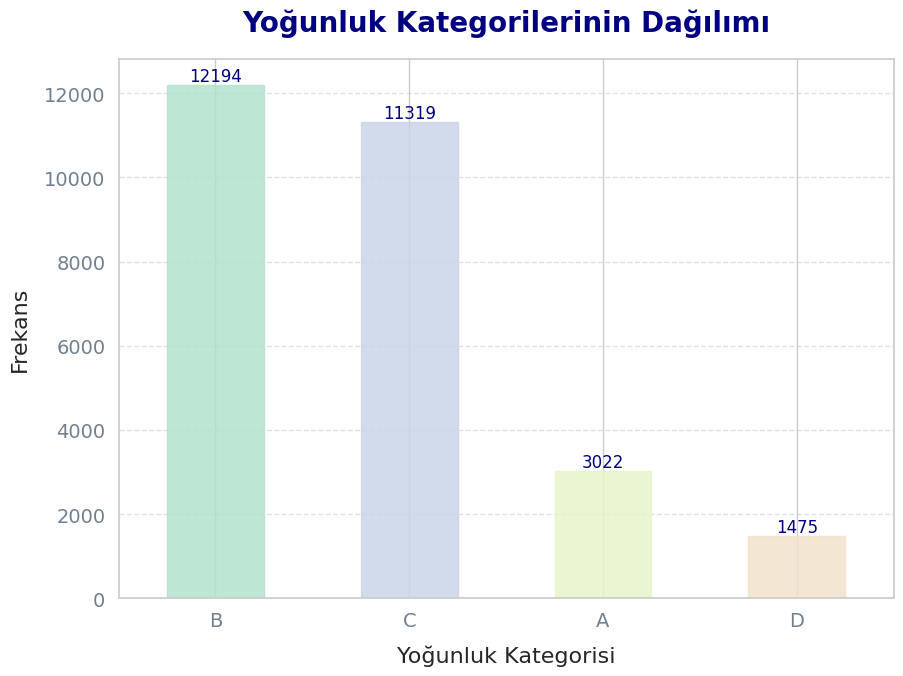

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastel tonlarında yüksek kaliteli bir stil ayarla
sns.set(style="whitegrid")

# 'density' kategorilerinin dağılımını çizme ve iyileştirmeler
plt.figure(figsize=(10, 7))
density_counts = data_cleaned['density'].value_counts()
bars = density_counts.plot(kind='bar', color='lightsteelblue', edgecolor='black', alpha=0.85)

# Başlık ve etiketler
plt.title('Yoğunluk Kategorilerinin Dağılımı', fontsize=20, fontweight='bold', color='navy', pad=20)
plt.xlabel('Yoğunluk Kategorisi', fontsize=16, labelpad=10)
plt.ylabel('Frekans', fontsize=16, labelpad=10)

# Barlara pastel renk gradyanı ekle
colormap = plt.cm.Pastel2
for i, bar in enumerate(bars.containers[0]):
    bar.set_color(colormap(i / len(density_counts)))

# Okunabilirlik için kesikli bir ızgara ekle
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Her barın üstüne sayı ekle
for i, (density, count) in enumerate(density_counts.items()):
    plt.text(i, count + 5, f'{count}', ha='center', va='bottom', fontsize=12, color='navy')

# Tık işaretlerini özelleştir
plt.xticks(fontsize=14, color='slategray', rotation=0)
plt.yticks(fontsize=14, color='slategray')

# Grafiği göster
plt.show()


In [55]:
# Her 'density' kategorisindeki görüntü sayısını göster
image_count_per_density = data_cleaned['density'].value_counts()

# Her yoğunluk kategorisindeki görüntü sayısını yazdır
print("Her yoğunluk kategorisindeki görüntü sayısı:")
print(image_count_per_density)


Her yoğunluk kategorisindeki görüntü sayısı:
density
B    12194
C    11319
A     3022
D     1475
Name: count, dtype: int64


In [56]:
import pandas as pd
from sklearn.model_selection import train_test_split

# 1. Etiket CSV’sini yükle
cancer_labels = pd.read_csv("/kaggle/input/rsna-breast-cancer-detection/train.csv")

# 2. Eğer 'cancer' sütunu zaten varsa, merge yapmadan geç
if 'cancer' not in data_cleaned.columns:
    data_cleaned = data_cleaned.merge(
        cancer_labels[['patient_id', 'image_id', 'cancer']], 
        on=['patient_id', 'image_id'], 
        how='left'
    )

# 3. 'label' sütununu oluştur
if 'cancer_y' in data_cleaned.columns:
    data_cleaned['label'] = data_cleaned['cancer_y']
else:
    data_cleaned['label'] = data_cleaned['cancer']

# 4. Gereksiz sütunları sil
for col in ['cancer_x', 'cancer_y']:
    if col in data_cleaned.columns:
        data_cleaned.drop(columns=col, inplace=True)

# 5. Stratified split için patient_id bazlı density modunu al
patient_data = data_cleaned.groupby('patient_id')['density'].agg(lambda x: x.mode()[0]).reset_index()

train_patients, temp_patients = train_test_split(
    patient_data, test_size=0.2, stratify=patient_data['density'], random_state=42
)

val_patients, test_patients = train_test_split(
    temp_patients, test_size=0.5, stratify=temp_patients['density'], random_state=42
)

# 6. Alt kümeleri oluştur
train_df = data_cleaned[data_cleaned['patient_id'].isin(train_patients['patient_id'])].copy()
val_df = data_cleaned[data_cleaned['patient_id'].isin(val_patients['patient_id'])].copy()
test_df = data_cleaned[data_cleaned['patient_id'].isin(test_patients['patient_id'])].copy()

# 7. Dosyaya kaydet
train_df.to_csv('/kaggle/working/train_df.csv', index=False)
val_df.to_csv('/kaggle/working/val_df.csv', index=False)
test_df.to_csv('/kaggle/working/test_df.csv', index=False)

# 8. Kontrol çıktıları
print("✅ Eğitim seti boyutu:", len(train_df))
print("✅ Doğrulama seti boyutu:", len(val_df))
print("✅ Test seti boyutu:", len(test_df))


✅ Eğitim seti boyutu: 22431
✅ Doğrulama seti boyutu: 2760
✅ Test seti boyutu: 2819


In [57]:
# Her setteki kategoriye ait görsel sayıları
train_category_counts = train_df['density'].value_counts()
val_category_counts = val_df['density'].value_counts()
test_category_counts = test_df['density'].value_counts()

# Kategori bazında sayıları ekrana yazdırma
print("Her setteki kategoriye ait görsel sayıları:")
print("Eğitim seti:\n", train_category_counts)
print("\nDoğrulama seti:\n", val_category_counts)
print("\nTest seti:\n", test_category_counts)


Her setteki kategoriye ait görsel sayıları:
Eğitim seti:
 density
B    9769
C    9067
A    2423
D    1172
Name: count, dtype: int64

Doğrulama seti:
 density
B    1198
C    1116
A     301
D     145
Name: count, dtype: int64

Test seti:
 density
B    1227
C    1136
A     298
D     158
Name: count, dtype: int64


In [58]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Label Encoding işlemi
le = LabelEncoder()

# Kategorik özellikleri sayısal verilere dönüştürme
data['laterality_encoded'] = le.fit_transform(data['laterality'])
data['implant_encoded'] = le.fit_transform(data['implant'])
data['difficult_negative_case_encoded'] = le.fit_transform(data['difficult_negative_case'])
data['view_encoded'] = le.fit_transform(data['view'])
data['density_encoded'] = le.fit_transform(data['density'])
data['site_id_encoded'] = le.fit_transform(data['site_id'])

# Etkileşimli özellikler oluşturma
data['implant_density_interaction'] = data['implant_encoded'] * data['density_encoded']
data['laterality_site_interaction'] = data['laterality_encoded'] * data['site_id_encoded']

# İstatistiksel özellikler oluşturma (örneğin, frekans sayısı)
data['implant_freq'] = data['implant'].map(data['implant'].value_counts())

# Veri normalizasyonu (sayısal veriler için)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# Normalizasyon işlemi
data[['implant_encoded', 'difficult_negative_case_encoded', 'view_encoded', 
      'density_encoded', 'site_id_encoded']] = scaler.fit_transform(
    data[['implant_encoded', 'difficult_negative_case_encoded', 'view_encoded', 
          'density_encoded', 'site_id_encoded']]
)

# Sonuçları kontrol etme
data.head()


,site_id,patient_id,image_id,laterality,view,age,cancer,biopsy,invasive,BIRADS,...,difficult_negative_case,laterality_encoded,implant_encoded,difficult_negative_case_encoded,view_encoded,density_encoded,site_id_encoded,implant_density_interaction,laterality_site_interaction,implant_freq
0,2,10006,462822612,L,CC,61.0,0,0,0,NaN,...,False,0,0.0,0.0,0.2,1.0,1.0,0,0,53229
1,2,10006,1459541791,L,MLO,61.0,0,0,0,NaN,...,False,0,0.0,0.0,1.0,1.0,1.0,0,0,53229
2,2,10006,1864590858,R,MLO,61.0,0,0,0,NaN,...,False,1,0.0,0.0,1.0,1.0,1.0,0,1,53229
3,2,10006,1874946579,R,CC,61.0,0,0,0,NaN,...,False,1,0.0,0.0,0.2,1.0,1.0,0,1,53229
4,2,10011,220375232,L,CC,55.0,0,0,0,0.0,...,True,0,0.0,1.0,0.2,1.0,1.0,0,0,53229


In [59]:
import os
import numpy as np
import pandas as pd
import pydicom
import cv2
from tqdm import tqdm

# 📍 Dizin ayarları
csv_path = '/kaggle/input/rsna-breast-cancer-detection/train.csv'
dcm_dir = '/kaggle/input/rsna-breast-cancer-detection/train_images'
output_dir = '/kaggle/working/rsna-breast-cancer-256-pngs'
os.makedirs(output_dir, exist_ok=True)

# 📊 CSV'den kanserli örnekleri al, max 400 tanesini örnekle
df = pd.read_csv(csv_path)
df_pos = df[df['cancer'] == 1].sample(n=400, random_state=42)

# Mevcut PNG'ler – aynı dosya varsa tekrar yazılmaz
existing = set(os.listdir(output_dir))

# 🔁 DICOM → PNG dönüşüm + maskeleme + kayıt
for _, row in tqdm(df_pos.iterrows(), total=len(df_pos)):
    pid = str(row['patient_id'])
    img_id = str(row['image_id'])
    filename = f"{pid}_{img_id}.png"

    if filename in existing:
        continue  # zaten varsa atla

    dcm_path = os.path.join(dcm_dir, pid, img_id + '.dcm')
    if not os.path.exists(dcm_path):
        continue

    try:
        im = pydicom.dcmread(dcm_path)
        pixels = im.pixel_array.astype(np.float32)

        # MONOCHROME1 düzeltmesi
        if im.PhotometricInterpretation == "MONOCHROME1":
            pixels = np.amax(pixels) - pixels
        else:
            pixels = pixels - np.min(pixels)

        # Normalize (0-255 arası)
        if np.max(pixels) != 0:
            pixels = pixels / np.max(pixels)
        pixels = (pixels * 255).astype(np.uint8)

        # Maskeleme: kontur üzerinden ROI çıkarımı
        bin_pixels = cv2.threshold(pixels, 20, 255, cv2.THRESH_BINARY)[1]
        contours, _ = cv2.findContours(bin_pixels, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

        if contours:
            contour = max(contours, key=cv2.contourArea)
            mask = np.zeros_like(pixels, dtype=np.uint8)
            cv2.drawContours(mask, [contour], -1, 255, cv2.FILLED)
            masked_pixels = cv2.bitwise_and(pixels, mask)
        else:
            masked_pixels = pixels  # kontur bulunamazsa orijinal görüntü

        # Kaydet
        out_path = os.path.join(output_dir, filename)
        cv2.imwrite(out_path, masked_pixels)

    except Exception as e:
        print(f"Hata: {filename} - {e}")


100%|██████████| 400/400 [04:53<00:00,  1.36it/s]


In [60]:
import pandas as pd

# Orijinal RSNA CSV
csv_path = '/kaggle/input/rsna-breast-cancer-detection/train.csv'
df = pd.read_csv(csv_path)

# Pozitif örneklerden 400 tanesini al
df_pos_400 = df[df['cancer'] == 1].sample(n=400, random_state=42).copy()

# Yeni dosya adlarını ekleyelim (daha sonra eşleştirme kolay olur)
df_pos_400['filename'] = df_pos_400.apply(
    lambda row: f"{row['patient_id']}_{row['image_id']}.png", axis=1
)

# Sadece gerekli sütunları tut (eğer model bu kolonlara ihtiyaç duyuyorsa ayarla)
df_pos_400 = df_pos_400[['patient_id', 'image_id', 'cancer', 'filename']]

# Kaydet
df_pos_400.to_csv('/kaggle/working/extra_positive_400.csv', index=False)
print("✅ extra_positive_400.csv dosyası başarıyla oluşturuldu.")


✅ extra_positive_400.csv dosyası başarıyla oluşturuldu.


In [61]:
train_df = pd.read_csv('/kaggle/working/train_df.csv')
extra_df = pd.read_csv('/kaggle/working/extra_positive_400.csv')
train_df_updated = pd.concat([train_df, extra_df], ignore_index=True)
train_df_updated.to_csv('/kaggle/working/train_df.csv', index=False)


In [62]:
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit

# Güncellenmiş train_df'yi oku (400 pozitif dahil)
df = pd.read_csv('/kaggle/working/train_df.csv')

# Aynı hastadan birden fazla görüntü varsa, sadece birini temsilci olarak al
patient_df = df.groupby('patient_id').first().reset_index()
X = patient_df['patient_id']
y = patient_df['cancer']

# Stratified splitter (önce train+val/test, sonra train/val)
sss1 = StratifiedShuffleSplit(n_splits=1, test_size=0.15, random_state=42)
train_val_idx, test_idx = next(sss1.split(X, y))

train_val_patients = patient_df.iloc[train_val_idx]['patient_id']
test_patients = patient_df.iloc[test_idx]['patient_id']

# Train/val ayrımı
train_val_df = patient_df.iloc[train_val_idx]
sss2 = StratifiedShuffleSplit(n_splits=1, test_size=0.15 / 0.85, random_state=42)
train_idx, val_idx = next(sss2.split(train_val_df['patient_id'], train_val_df['cancer']))

train_patients = train_val_df.iloc[train_idx]['patient_id']
val_patients = train_val_df.iloc[val_idx]['patient_id']

# 🔄 Orijinal dataframe'den gerçek verileri çek
train_df_final = df[df['patient_id'].isin(train_patients)]
val_df_final = df[df['patient_id'].isin(val_patients)]
test_df_final = df[df['patient_id'].isin(test_patients)]

# 💾 Kaydet
train_df_final.to_csv('/kaggle/working/train_df.csv', index=False)
val_df_final.to_csv('/kaggle/working/val_df.csv', index=False)
test_df_final.to_csv('/kaggle/working/test_df.csv', index=False)

# ✅ Kontrol
print("Train:", len(train_df_final))
print("Val:", len(val_df_final))
print("Test:", len(test_df_final))
print("Pozitif oranları:")
print("Train:", train_df_final['cancer'].mean())
print("Val:", val_df_final['cancer'].mean())
print("Test:", test_df_final['cancer'].mean())


Train: 15992
Val: 3424
Test: 3415
Pozitif oranları:
Train: 0.04045772886443222
Val: 0.039427570093457945
Test: 0.04304538799414349


In [63]:
train_df = pd.read_csv('/kaggle/working/train_df.csv')
val_df = pd.read_csv('/kaggle/working/val_df.csv')
test_df = pd.read_csv('/kaggle/working/test_df.csv')


✅ Dengeli eğitim verisi hazır: 30675 örnek
label
0.0    15345
1.0    15330
Name: count, dtype: int64


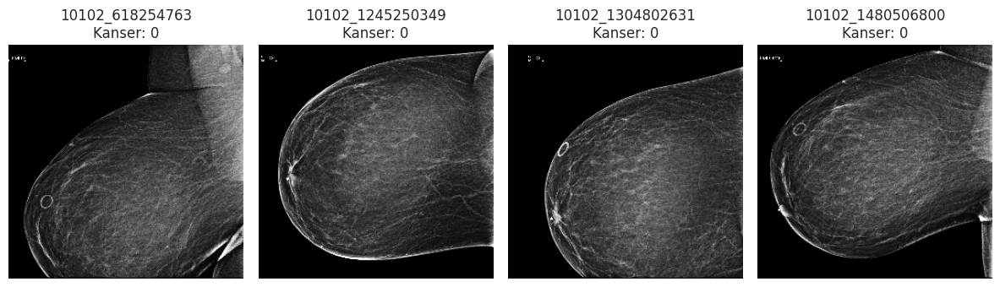

In [64]:
import torch
from torch.utils.data import Dataset
import pandas as pd
import os
import cv2
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt

# ---------------------- CSV Hazırlığı: Pozitifleri Dengeleme ----------------------
def prepare_balanced_csv(small_csv_path, big_csv_path, output_path):
    df_small = pd.read_csv(small_csv_path)
    df_big = pd.read_csv(big_csv_path)

    if 'label' not in df_small.columns:
        df_small['label'] = df_small.get('cancer', 0)

    df_cancer = df_big[df_big['cancer'] == 1][['patient_id', 'image_id', 'cancer']]
    df_cancer = df_cancer.rename(columns={'cancer': 'label'})

    df_combined = pd.concat([df_small, df_cancer], ignore_index=True)
    df_combined = df_combined.sample(frac=1, random_state=42).reset_index(drop=True)

    n_neg = df_combined['label'].value_counts()[0]
    n_pos = df_combined['label'].value_counts()[1]
    augment_factor = n_neg // n_pos

    df_pos_aug = pd.concat([df_combined[df_combined['label'] == 1]] * augment_factor, ignore_index=True)
    df_balanced = pd.concat([df_combined[df_combined['label'] == 0], df_pos_aug], ignore_index=True)
    df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)
    df_balanced.to_csv(output_path, index=False)

    print(f"✅ Dengeli eğitim verisi hazır: {len(df_balanced)} örnek")
    print(df_balanced['label'].value_counts())

prepare_balanced_csv(
    '/kaggle/working/train_df.csv',
    '/kaggle/input/rsna-breast-cancer-detection/train.csv',
    '/kaggle/working/train_df_balanced.csv'
)

# ---------------------- Dataset Sınıfı ----------------------
class BreastCancerDataset(Dataset):
    def __init__(self, csv_file, img_dir, transform=None):
        self.data = pd.read_csv(csv_file)
        self.img_dir = img_dir
        self.transform = transform

        if 'label' not in self.data.columns:
            self.data['label'] = self.data.get('cancer', 0)

        # NaN olan etiketleri çıkar
        self.data = self.data[~self.data['label'].isna()].reset_index(drop=True)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.img_dir, f"{row['patient_id']}_{row['image_id']}.png")
        image = cv2.imread(img_path)

        if image is None:
            raise FileNotFoundError(f"Görsel bulunamadı: {img_path}")

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transform:
            image = self.transform(image=image)["image"]

        return image, row['label'], row['patient_id'], row['image_id']


# ---------------------- Transformlar ----------------------
train_transform = A.Compose([
    A.Resize(224, 224),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.Affine(translate_percent=0.1, scale=0.1, rotate=20, p=0.4),
    A.MedianBlur(blur_limit=3, p=0.05),
    A.GaussianBlur(blur_limit=(3, 5), p=0.05),
    A.GaussNoise(p=0.1),
    A.ElasticTransform(p=0.05),
    A.GridDistortion(p=0.05),
    A.OpticalDistortion(p=0.05),
    A.CoarseDropout(p=0.2),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_test_transform = A.Compose([
    A.Resize(224, 224),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

# ---------------------- Dataset Tanımları ----------------------
train_dataset = BreastCancerDataset(
    '/kaggle/working/train_df_balanced.csv',
    '/kaggle/input/rsna-breast-cancer-256-pngs',
    transform=train_transform
)

val_dataset = BreastCancerDataset(
    '/kaggle/working/val_df.csv',
    '/kaggle/input/rsna-breast-cancer-256-pngs',
    transform=val_test_transform
)

test_dataset = BreastCancerDataset(
    '/kaggle/working/test_df.csv',
    '/kaggle/input/rsna-breast-cancer-256-pngs',
    transform=val_test_transform
)

raw_dataset = BreastCancerDataset(
    '/kaggle/working/train_df.csv',
    '/kaggle/input/rsna-breast-cancer-256-pngs',
    transform=None
)

# ---------------------- Görsel Gösterme Fonksiyonu ----------------------
def display_sample_images(dataset, num_images=4):
    plt.figure(figsize=(12, 6))
    shown = 0
    idx = 0

    while shown < num_images and idx < len(dataset):
        image, label, pid, iid = dataset[idx]
        idx += 1

        if isinstance(image, torch.Tensor):
            image_np = image.permute(1, 2, 0).numpy()
            image_np = image_np * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
            image_np = np.clip(image_np, 0, 1)
        else:
            image_np = image / 255.0

        if 0.05 < np.mean(image_np) < 0.95:
            ax = plt.subplot(1, num_images, shown + 1)
            plt.imshow(image_np)
            plt.axis("off")
            ax.set_title(f"{pid}_{iid}\nKanser: {int(label)}")
            shown += 1

    plt.tight_layout()
    plt.show()

# ---------------------- Örnek Görselleri Göster ----------------------
display_sample_images(raw_dataset, num_images=4)


In [65]:
# Directory containing images
img_dir = "/kaggle/input/rsna-breast-cancer-256-pngs"
 # Update this path to your image folder

# Paths to CSV files for each dataset split
train_csv = '/kaggle/working/train_df.csv'
val_csv = '/kaggle/working/val_df.csv'
test_csv = '/kaggle/working/test_df.csv'

In [66]:
# Her setteki patient_id'leri küme olarak alalım
train_patients_set = set(train_df['patient_id'])
val_patients_set = set(val_df['patient_id'])
test_patients_set = set(test_df['patient_id'])

# Kesişim olup olmadığını kontrol edelim
print("Eğitim & Doğrulama ortak hasta sayısı:", len(train_patients_set & val_patients_set))
print("Eğitim & Test ortak hasta sayısı:", len(train_patients_set & test_patients_set))
print("Doğrulama & Test ortak hasta sayısı:", len(val_patients_set & test_patients_set))


Eğitim & Doğrulama ortak hasta sayısı: 0
Eğitim & Test ortak hasta sayısı: 0
Doğrulama & Test ortak hasta sayısı: 0


In [67]:
!pip install -U albumentations


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.1/43.1 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 369.4/369.4 kB 7.2 MB/s eta 0:00:00
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.23
    Uninstalling albucore-0.0.23:
      Successfully uninstalled albucore-0.0.23
  Attempting uninstall: albumentations
    Found existing installation: albumentations 2.0.4
    Uninstalling albumentations-2.0.4:
      Successfully uninstalled albumentations-2.0.4


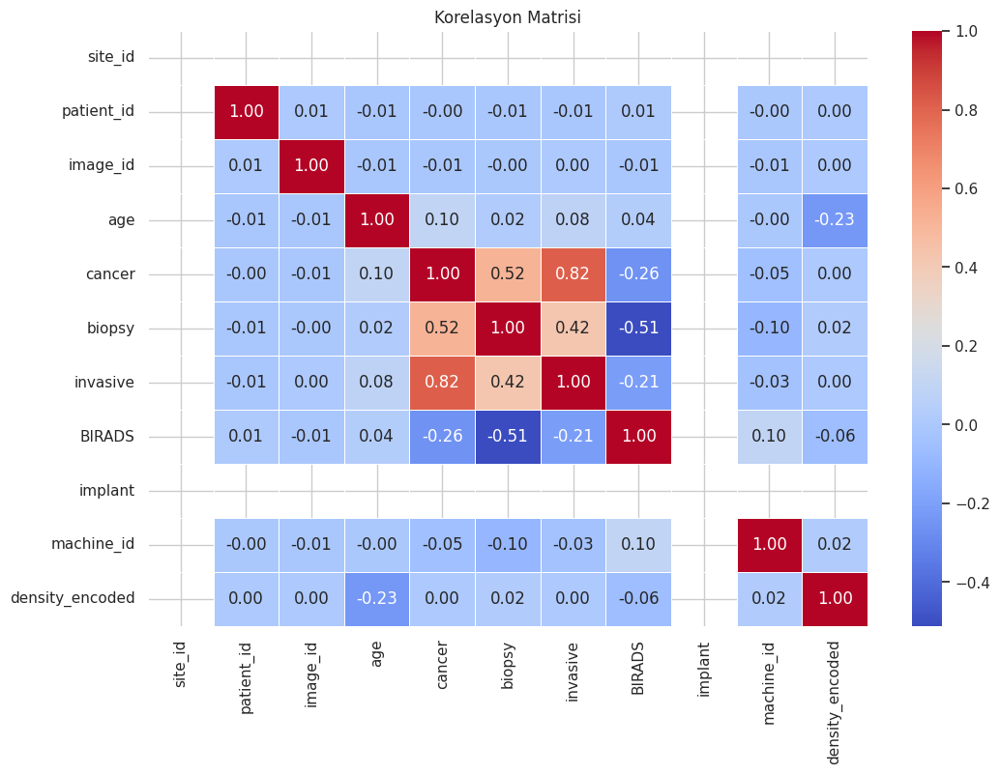

In [68]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Veriyi yükleyelim
df_preprocessed = pd.read_csv('/kaggle/working/data_preprocessed.csv')

# Sayısal sütunları seçelim (örneğin 'age', 'BIRADS', 'density_encoded' vb.)
numeric_columns = df_preprocessed.select_dtypes(include=['float64', 'int64']).columns

# Sayısal sütunları içeren yeni bir DataFrame oluşturuyoruz
df_numeric = df_preprocessed[numeric_columns]

# Korelasyon matrisini hesaplayalım
correlation_matrix = df_numeric.corr()

# Korelasyon matrisini görselleştirelim
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
plt.title('Korelasyon Matrisi')
plt.show()



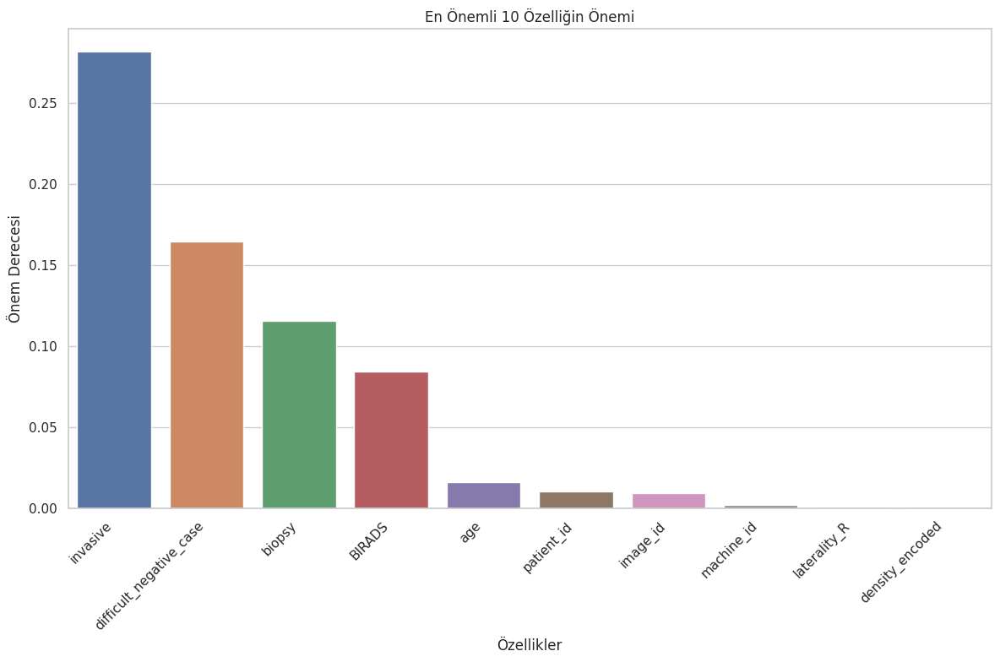

In [69]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer

# Veriyi yükleyelim
df_preprocessed = pd.read_csv('/kaggle/working/data_preprocessed.csv')

# Hedef değişken ve özellikleri ayır
y = df_preprocessed['cancer']
X_raw = df_preprocessed.drop('cancer', axis=1)
X_encoded = pd.get_dummies(X_raw, drop_first=True)

# Eksik değerleri doldur
imputer = SimpleImputer(strategy='mean')
X = pd.DataFrame(imputer.fit_transform(X_encoded), columns=X_encoded.columns)

# Modeli eğit
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

# Özellik önemlerini al ve sırala
feature_importances = (
    pd.DataFrame(rf.feature_importances_, index=X.columns, columns=['importance'])
    .sort_values('importance', ascending=False)
)

# İlk 10 özelliği ayıkla
top_10 = feature_importances.head(10)

# dikey bar plot: x=özellikler, y=önem
plt.figure(figsize=(12, 8))
sns.barplot(x=top_10.index, y=top_10['importance'])
plt.title('En Önemli 10 Özelliğin Önemi')
plt.xlabel('Özellikler')
plt.ylabel('Önem Derecesi')
plt.xticks(rotation=45, ha='right')  # etiketleri döndürmek okuma rahatlığı için
plt.tight_layout()
plt.show()


In [70]:
!pip install torchsummary

Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth
100%|██████████| 82.7M/82.7M [00:00<00:00, 169MB/s]


[01] ⏱ 358.3s | Train Loss: 0.1598, Acc: 0.5992 | Val Loss: 0.1997, Acc: 0.5155, F1: 0.0770, AUC: 0.8158
[02] ⏱ 348.4s | Train Loss: 0.1440, Acc: 0.6662 | Val Loss: 0.0697, Acc: 0.8805, F1: 0.1483, AUC: 0.8441
[03] ⏱ 348.5s | Train Loss: 0.1278, Acc: 0.7152 | Val Loss: 0.0830, Acc: 0.8520, F1: 0.1942, AUC: 0.9205
[04] ⏱ 348.4s | Train Loss: 0.1134, Acc: 0.7550 | Val Loss: 0.0379, Acc: 0.9462, F1: 0.3737, AUC: 0.9553
[05] ⏱ 348.6s | Train Loss: 0.1003, Acc: 0.7851 | Val Loss: 0.0358, Acc: 0.9426, F1: 0.4062, AUC: 0.9829
[06] ⏱ 348.6s | Train Loss: 0.0904, Acc: 0.8063 | Val Loss: 0.0417, Acc: 0.9441, F1: 0.4405, AUC: 0.9906
[07] ⏱ 348.6s | Train Loss: 0.0830, Acc: 0.8220 | Val Loss: 0.0162, Acc: 0.9789, F1: 0.6758, AUC: 0.9968
[08] ⏱ 348.4s | Train Loss: 0.0780, Acc: 0.8328 | Val Loss: 0.0138, Acc: 0.9831, F1: 0.7246, AUC: 0.9981
[09] ⏱ 349.0s | Train Loss: 0.0751, Acc: 0.8374 | Val Loss: 0.0099, Acc: 0.9878, F1: 0.7853, AUC: 0.9991
[10] ⏱ 348.7s | Train Loss: 0.0727, Acc: 0.8442 | Val L

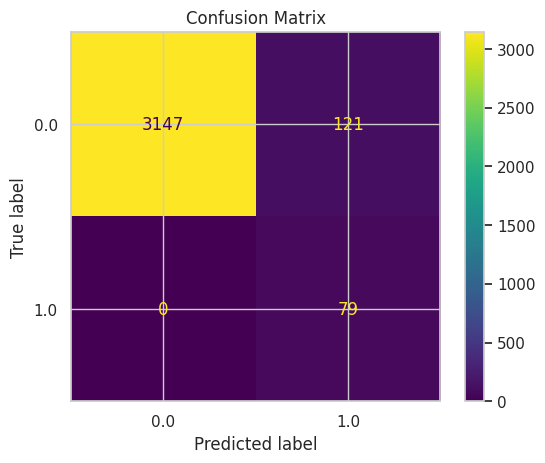

In [71]:
import torch
import torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import time

# -------------------- Focal Loss --------------------
class FocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=2, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        self.bce = nn.BCEWithLogitsLoss(reduction='none')

    def forward(self, inputs, targets):
        loss = self.bce(inputs.view(-1), targets.float())
        pt = torch.exp(-loss)
        focal = self.alpha * (1 - pt) ** self.gamma * loss
        return focal.mean() if self.reduction == 'mean' else focal

# -------------------- Model --------------------
def get_model():
    model = models.efficientnet_v2_s(weights="DEFAULT")
    in_features = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(in_features, 1)
    return model

# -------------------- Eğitim Fonksiyonu --------------------
def train_one_epoch(model, loader, optimizer, loss_fn, device):
    model.train()
    total_loss = 0
    all_preds, all_labels = [], []

    for images, labels, *_ in loader:
        images, labels = images.to(device), labels.to(device).float()
        optimizer.zero_grad()
        outputs = model(images).view(-1)
        loss = loss_fn(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * len(labels)
        all_preds.extend(torch.sigmoid(outputs).detach().cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    acc = accuracy_score(all_labels, np.array(all_preds) > 0.5)
    return total_loss / len(loader.dataset), acc

# -------------------- Doğrulama Fonksiyonu --------------------
def evaluate(model, loader, loss_fn, device):
    model.eval()
    total_loss = 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels, *_ in loader:
            images, labels = images.to(device), labels.to(device).float()
            outputs = model(images).view(-1)
            loss = loss_fn(outputs, labels)

            total_loss += loss.item() * len(labels)
            all_preds.extend(torch.sigmoid(outputs).cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    acc = accuracy_score(all_labels, np.array(all_preds) > 0.5)
    f1 = f1_score(all_labels, np.array(all_preds) > 0.5)
    auc = roc_auc_score(all_labels, all_preds)
    return total_loss / len(loader.dataset), acc, f1, auc

# -------------------- Eğitim Döngüsü --------------------
def train_model(model, train_loader, val_loader, loss_fn, optimizer, scheduler, device, num_epochs=30, patience=5):
    best_val_loss = float('inf')
    best_model_wts = None
    counter = 0

    for epoch in range(num_epochs):
        start = time.time()
        train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, loss_fn, device)
        val_loss, val_acc, val_f1, val_auc = evaluate(model, val_loader, loss_fn, device)
        scheduler.step()

        print(f"[{epoch+1:02d}] ⏱ {time.time()-start:.1f}s | "
              f"Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}, F1: {val_f1:.4f}, AUC: {val_auc:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = model.state_dict()
            torch.save(model.state_dict(), '/kaggle/working/best_model.pt')
            counter = 0
        else:
            counter += 1
            if counter >= patience:
                print("⏹️ Early stopping")
                break

    model.load_state_dict(best_model_wts)
    return model

# -------------------- Veri Yükleyiciler --------------------
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)

# -------------------- Eğitim Başlat --------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = get_model().to(device)

loss_fn = FocalLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)

trained_model = train_model(model, train_loader, val_loader, loss_fn, optimizer, scheduler, device)

# Eğitimi bitmiş (en iyi ağırlıkları içeren) modeli tekrar kaydet
torch.save(trained_model.state_dict(), "/kaggle/working/final_best_model.pt")
print("✅ Model dosyaya kaydedildi: final_best_model.pt")


# -------------------- Test Değerlendirme --------------------
test_loss, test_acc, test_f1, test_auc = evaluate(trained_model, test_loader, loss_fn, device)
print(f"📊 Test Loss: {test_loss:.4f} | Acc: {test_acc:.4f} | F1: {test_f1:.4f} | AUC: {test_auc:.4f}")


from sklearn.metrics import ConfusionMatrixDisplay

trained_model.eval()
all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels, *_ in test_loader:
        images = images.to(device)
        outputs = trained_model(images).view(-1)
        all_preds.extend(torch.sigmoid(outputs).cpu().numpy())
        all_labels.extend(labels.numpy())

y_pred = np.array(all_preds) > 0.5
disp = ConfusionMatrixDisplay.from_predictions(all_labels, y_pred)
disp.ax_.set_title("Confusion Matrix")
plt.show()


Tahmin: 🟢 KANSER YOK (olasılık: 0.4399)


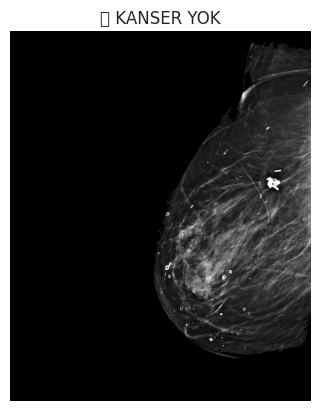

In [72]:
import torch
import torch.nn as nn
from torchvision import models
import cv2
import matplotlib.pyplot as plt
import albumentations as A
from albumentations.pytorch import ToTensorV2

# 🔧 Modeli oluştur ve eğitilmiş ağırlıkları yükle
def load_trained_model(weights_path, device):
    model = models.efficientnet_v2_s(weights="DEFAULT")
    in_features = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(in_features, 1)
    model.load_state_dict(torch.load(weights_path, map_location=device))
    return model.to(device).eval()

# 🔍 Görseli işle ve tahmin yap
def predict_image(image_path, model, device):
    image = cv2.imread(image_path)
    if image is None:
        print(f"⚠️ Görsel okunamadı: {image_path}")
        return

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    transform = A.Compose([
        A.Resize(224, 224),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ])
    tensor_image = transform(image=image_rgb)['image'].unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(tensor_image)
        prob = torch.sigmoid(output).item()
        pred_label = "🔴 KANSER VAR" if prob > 0.5 else "🟢 KANSER YOK"
        print(f"Tahmin: {pred_label} (olasılık: {prob:.4f})")

    plt.imshow(image_rgb)
    plt.title(pred_label)
    plt.axis("off")
    plt.show()

# 🚀 Kullanım
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = "/kaggle/working/final_best_model.pt"  # ✅ Eğitilmiş modelin yolu
image_path = "/kaggle/working/rsna-breast-cancer-256-pngs/10130_1360338805.png"  # ✅ Test edilecek görselin yolu

model = load_trained_model(model_path, device)
predict_image(image_path, model, device)


In [73]:
!pip install -q gradio


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.3/54.3 MB 31.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.6/323.6 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 82.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.4/62.4 kB 2.6 MB/s eta 0:00:00


In [74]:
import torch
import torch.nn as nn
from torchvision import models
import cv2
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
import gradio as gr
from PIL import Image

# 🔧 Modeli yükle
def load_trained_model(weights_path, device):
    model = models.efficientnet_v2_s(weights="DEFAULT")
    in_features = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(in_features, 1)
    model.load_state_dict(torch.load(weights_path, map_location=device))
    return model.to(device).eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = "/kaggle/working/final_best_model.pt"
model = load_trained_model(model_path, device)

# 🔍 Tahmin fonksiyonu
def predict_pil_image(pil_img):
    image_np = np.array(pil_img.convert("RGB"))
    transform = A.Compose([
        A.Resize(224, 224),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ])
    tensor_image = transform(image=image_np)['image'].unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(tensor_image)
        prob = torch.sigmoid(output).item()
        label = "🔴 KANSER VAR" if prob > 0.5 else "🟢 KANSER YOK"
        return f"{label} (Olasılık: {prob:.4f})"

# 🖼️ Gradio Arayüzü
interface = gr.Interface(
    fn=predict_pil_image,
    inputs=gr.Image(type="pil", label="Mamografi Görselini Yükle"),
    outputs=gr.Textbox(label="Tahmin Sonucu"),
    title="Meme Kanseri Tahmin Sistemi",
    description="Mamografi görseli yükleyin, sistem kanser olup olmadığını tahmin etsin."
)

# 🌐 Kaggle için paylaşılabilir link oluştur
interface.launch(share=True)


* Running on local URL:  http://127.0.0.1:7860
* Running on public URL: https://cf5d244b9b10c7e232.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
